<a href="https://colab.research.google.com/github/em0608nik/behaviour_analysis/blob/main/user_behaviour.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 4CBLW00-17 Urban mobility startups for livable cities - simulation

### Instalation of tools
- _Openrouteservice_ for obtaining travel times
- _SimPy_ for simulating agents renting bikes
- _Folium_ for map visualizations
- _Geopandas_, _Matplotlib_ and _Contextily_ for working with map data

Uncomment and run the code cell below to install them:

In [ ]:
%pip install openrouteservice
%pip install simpy
%pip install folium
%pip install geopandas matplotlib contextily
%pip install osmnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 58.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 2.0 MB/s eta 0:00:00


## Part 1: Using geographical data of Eindhoven and bike network to obtain approximate travel times
- [Services | openrouteservice](https://openrouteservice.org/services/)
    - Offers a service to calculate _many-to-many_ travel times using bikes (including e-bikes)
, can be access through API. We could fetch the data once and store them for further use. (better use openrouteservice-py)

[Quickstart — openrouteservice-py 0.4 documentation](https://openrouteservice-py.readthedocs.io/en/latest/) is what we'll actually use. _"The openrouteservice library gives you painless access to the openrouteservice (ORS) routing API’s. It performs requests against our API’s for"_

As suggested, we will use `Simpy` to simulate users of the systems renting and using bikes
We can use `Folium` to perform map visualizations

## Station locations
- Research spots in chosen neighbourhoods to serve as stations
- Different tiers
- Size of stations (how many bikes dock)
  - Smaller ones next to bus stops, stores, cafes etc.
  - Bigger (with charging docks)


In [ ]:
# Placeholder coordinates around Eindhoven
stations = {
    'Station A': (51.4408, 5.4789),
    'Station B': (51.4350, 5.4850),
    'Station C': (51.4500, 5.4600),
    'Station D': (51.4200, 5.5000),
}

## Bike-Sharing Simulation and User Behaviour Analysis
**Focusing on finding the optimal station placement in Karpen, Vredeoord and Acht in Eindhoven**



Readying up packages:

In [ ]:
!pip install osmnx
!pip install contextily
!pip install matplotlib-scalebar


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.5/100.5 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 31.3 MB/s eta 0:00:00


In the cell below we load the data from the maps outlining existing electrical stations in the indicated neighbourhoods.

In [ ]:
import folium
import geopandas as gpd

# custom OpenStreetMap data with existing ES
existing_stations = gpd.read_file('eindhoven.geojson')

# Create a base map centered on Eindhoven
eindhoven_coords = [51.4416, 5.4697]
m = folium.Map(location=eindhoven_coords, zoom_start=13)

# Add existing stations to the map
for idx, row in existing_stations.iterrows():
    # Check if the geometry is a Point before accessing .y and .x
    if row.geometry.type == 'Point':
        folium.Marker(
            location=[row.geometry.y, row.geometry.x],
            popup=f"Station {row['name']}",
            icon=folium.Icon(color='blue')
        ).add_to(m)
    else:
        # Handle other geometry types if necessary, e.g., print a warning
        print(f"Skipping row {idx} with geometry type {row.geometry.type}")


m

<ipython-input-3-d48b9970918f>:14: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if row.geometry.type == 'Point':
<ipython-input-3-d48b9970918f>:22: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  print(f"Skipping row {idx} with geometry type {row.geometry.type}")


Skipping row 93 with geometry type Polygon
Skipping row 94 with geometry type Polygon
Skipping row 95 with geometry type Polygon
Skipping row 96 with geometry type LineString
Skipping row 97 with geometry type LineString
Skipping row 98 with geometry type LineString
Skipping row 99 with geometry type LineString
Skipping row 100 with geometry type LineString
Skipping row 101 with geometry type LineString
Skipping row 102 with geometry type LineString
Skipping row 103 with geometry type LineString
Skipping row 104 with geometry type LineString
Skipping row 105 with geometry type Polygon
Skipping row 106 with geometry type Polygon
Skipping row 107 with geometry type Polygon
Skipping row 108 with geometry type LineString
Skipping row 109 with geometry type Polygon
Skipping row 110 with geometry type Polygon


Loading and mapping out the relevant datasets of bike lanes, amenities, and existing stations in our neighbourhoods.

In [ ]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from shapely.geometry import LineString, MultiLineString

# Load data
existing_stations = gpd.read_file('eindhoven.geojson')
amenities = gpd.read_file('proper_amenities.geojson')
bike_network = gpd.read_file('bike_lanes.geojson')

# Focus on neighborhoods of interest
neighborhoods = ['Karpen', 'Acht', 'Vredeoord']

# Create a base map centered on Eindhoven
m = folium.Map(location=[51.4416, 5.4697], zoom_start=13)

# Add bike network
for _, row in bike_network.iterrows():
    geometry = row['geometry']
    if isinstance(geometry, LineString):
        folium.PolyLine(locations=[(point[1], point[0]) for point in geometry.coords],
                        color='blue', weight=2).add_to(m)
    elif isinstance(geometry, MultiLineString):
        for part in geometry.geoms:
            folium.PolyLine(locations=[(point[1], point[0]) for point in part.coords],
                            color='blue', weight=2).add_to(m)


# Add existing stations
marker_cluster = MarkerCluster().add_to(m)
for _, row in existing_stations.iterrows():
    # Check if the geometry is a Point before accessing .y and .x cuz it breaks if it finds a polygon
    if row.geometry and row.geometry.geom_type == 'Point':
        folium.Marker([row.geometry.y, row.geometry.x],
                      popup=f"Station: {row.get('name', '')}").add_to(marker_cluster)


# Add amenities
for _, row in amenities.iterrows():
    # Check if the geometry is a Point before accessing .y and .x
    if row.geometry and row.geometry.geom_type == 'Point':
        folium.CircleMarker([row.geometry.y, row.geometry.x], radius=3,
                           color='green', fill=True,
                           popup=f"{row.get('amenity_type', '')}").add_to(m)


m.save('eindhoven_map.html')
m

## User Behaviour analysis

### User Demographic

need to find more info

### Temporal Analysis

Temporal analysis of user behaviour:

**Important to note**

No readily available dataset, so we need to generate and sum up the data on our own. Thus, the method I came up with is:

1. Getting public datasets, such as the biggest bicycle parkings (near important locations) and their opening times, traffic light flow, opening hours of amenities to gather enough data for the predictive analysis.

2. Using the NS rush-hour policy for ideas on which hours to focus on.

3. Synthetically combining this data to make a predicition on potential most used routes and the times in which the fleet would be the most busy.

Some confusing things:

For the simmulation, we have added "hourly usage pattern" to each ammenity type, which are based on typical usage behaviours (such as morning school rush, evening cafe visits etc.) In these 24-dimenstional vectors, each elements is an hour of the day, with the values being multipliers (0 is no usage, 2 is peak usage). Furthermore, the weights to each type of amenity is its impact on bicycle demand.  

We have added multipliers during the outlined NS rush-hour times, as those are the times where traffic is enhanced, both with bicycles and public transport.

How we determined the 24-dimensional vectors:

In [ ]:
import pandas as pd
import numpy as np
from datetime import time

def process_parking_availability(parking_hours_df):
    """
    Processes parking availability data from Eindhoven's Excel format.
    Returns a DataFrame with structured opening hours for each day.
    """
    parking_hours = pd.read_excel('fietsenstallingen.xsl')

    # Create a copy to avoid modifying the original
    parking = parking_hours_df.copy()

    # Standardize column names (remove Dutch prefixes if needed)
    parking.columns = [col.split('_')[-1] for col in parking.columns]

    # Days of week in order (Monday-Sunday)
    days = ['MAANDAG', 'DINSDAG', 'WOENSDAG', 'DONDERDAG', 'VRIJDAG', 'ZATERDAG', 'ZONDAG']

    # Create containers for processed data
    processed_data = []

    for _, row in parking.iterrows():
        parking_info = {
            'id': row['OBJECTID'],
            'name': row['NAAM'],
            'address': row['ADRES'],
            'type': row['TYPE']
        }

        # Process each day's hours
        for day in days:
            day_col = f'OPENINGSTIJDEN_{day}'
            hours_str = str(row[day_col]).lower().replace('uur', '').strip()

            # Handle special cases
            if 'niet beschikbaar' in hours_str or 'gesloten' in hours_str:
                parking_info[f'{day}_open'] = None
                parking_info[f'{day}_close'] = None
                parking_info[f'{day}_available'] = False
                continue

            if 'alleen op koopzondagen' in hours_str:
                # Special handling for WoensXL Sunday
                if day == 'ZONDAG':
                    hours_str = hours_str.split(',')[-1].strip()
                else:
                    parking_info[f'{day}_open'] = None
                    parking_info[f'{day}_close'] = None
                    parking_info[f'{day}_available'] = False
                    continue

            # Split opening and closing times
            try:
                open_str, close_str = hours_str.split('-')
                open_time = parse_dutch_time(open_str.strip())
                close_time = parse_dutch_time(close_str.strip())

                # Handle overnight cases (like 17:00-05:00 on Saturday in the centre)
                if close_time < open_time:
                    # Parking is open overnight (closes next day)
                    parking_info[f'{day}_open'] = open_time
                    parking_info[f'{day}_close'] = time(23, 59)
                    parking_info[f'{day}_next_day_close'] = close_time
                else:
                    parking_info[f'{day}_open'] = open_time
                    parking_info[f'{day}_close'] = close_time

                parking_info[f'{day}_available'] = True

            except (ValueError, AttributeError) as e:
                print(f"Error processing {row['NAAM']} {day}: {hours_str} - {e}")
                parking_info[f'{day}_open'] = None
                parking_info[f'{day}_close'] = None
                parking_info[f'{day}_available'] = False

        processed_data.append(parking_info)

    return pd.DataFrame(processed_data)

def parse_dutch_time(time_str):
    """
    Parses Dutch time formats including:
    - "08:00" (normal)
    - "4:30" (single digit hour)
    - "17:00-05:00" (overnight)
    """
    # Clean the string
    time_str = str(time_str).strip().replace('uur', '')

    # Handle empty or invalid cases
    if not time_str or time_str.lower() in ['niet beschikbaar', 'gesloten']:
        return None

    # Split hours and minutes
    if ':' in time_str:
        hours, minutes = time_str.split(':')
    else:
        # Handle times like "4 uur" -> "4:00"
        hours = time_str
        minutes = '00'

    # Remove non-numeric characters
    hours = ''.join(c for c in hours if c.isdigit())
    minutes = ''.join(c for c in minutes if c.isdigit())

    # Convert to integers
    hours = int(hours) if hours else 0
    minutes = int(minutes) if minutes else 0

    # Handle 24-hour overflow (e.g., 25:00 becomes 01:00)
    hours = hours % 24

    return time(hours, minutes)


In [ ]:
import pandas as pd
import numpy as np
from datetime import time, datetime
import matplotlib.pyplot as plt
from typing import Dict, Tuple
import geopandas as gpd # Import geopandas
import networkx as nx # Import networkx
from shapely.geometry import Point, LineString, MultiLineString, Polygon # Import necessary shapely geometries

class TemporalAnalyzer:
    def __init__(self, amenities_data: pd.DataFrame, parking_data: pd.DataFrame):
        """
        Initialize with amenities and parking datasets
        """
        self.amenities = amenities_data
        self.parking = self._process_parking_data(parking_data)
        self.time_bins = pd.date_range("00:00", "23:59", freq="30T").time

    def _process_parking_data(self, parking_df: pd.DataFrame) -> pd.DataFrame:
        """
        Process raw parking data from Eindhoven's Excel format
        """
        parking = parking_df.copy()
        days_mapping = {
            'MAANDAG': 'monday',
            'DINSDAG': 'tuesday',
            'WOENSDAG': 'wednesday',
            'DONDERDAG': 'thursday',
            'VRIJDAG': 'friday',
            'ZATERDAG': 'saturday',
            'ZONDAG': 'sunday'
        }

        processed_data = []

        for _, row in parking.iterrows():
            parking_info = {
                'id': row['OBJECTID'],
                'name': row['NAAM_FIETSENSTALLING'],
                'address': row['ADRES_OMSCHRIJVING'],
                'type': row['TYPE_STALLING']
            }

            for dutch_day, english_day in days_mapping.items():
                day_col = f'OPENINGSTIJDEN_{dutch_day}' if dutch_day != 'DONDERDAG' else 'OPENINGSTIJDS_DONDERDAG' # Corrected column name
                hours_str = str(row[day_col]).lower().replace('uur', '').strip()

                # Handle special cases
                if any(x in hours_str for x in ['niet beschikbaar', 'gesloten']):
                    parking_info.update({
                        f'{english_day}_open': None,
                        f'{english_day}_close': None,
                        f'{english_day}_available': False
                    })
                    continue

                # Handle special Sunday case for WoensXL
                if 'alleen op koopzondagen' in hours_str and dutch_day == 'ZONDAG':
                    hours_str = hours_str.split(',')[-1].strip()

                # Parse times
                try:
                    if '-' in hours_str:
                        open_str, close_str = hours_str.split('-')
                        open_time = self._parse_time(open_str.strip())
                        close_time = self._parse_time(close_str.strip())

                        # Handle overnight cases
                        if open_time is not None and close_time is not None and close_time < open_time:
                            parking_info.update({
                                f'{english_day}_open': open_time,
                                f'{english_day}_close': time(23, 59),
                                f'{english_day}_next_day_close': close_time,
                                f'{english_day}_available': True
                            })
                        else:
                            parking_info.update({
                                f'{english_day}_open': open_time,
                                f'{english_day}_close': close_time,
                                f'{english_day}_available': open_time is not None and close_time is not None
                            })
                    else:
                        # Handle cases without clear time range
                        parking_info.update({
                            f'{english_day}_open': None,
                            f'{english_day}_close': None,
                            f'{english_day}_available': False
                        })
                except Exception as e:
                    print(f"Error processing {row['NAAM_FIETSENSTALLING']} {dutch_day}: {e}")
                    parking_info.update({
                        f'{english_day}_open': None,
                        f'{english_day}_close': None,
                        f'{english_day}_available': False
                    })

            processed_data.append(parking_info)

        return pd.DataFrame(processed_data)

    def _parse_time(self, time_str: str) -> time:
        """
        Parse Dutch time strings into time objects
        """
        time_str = str(time_str).strip().replace('uur', '').strip() # Ensure 'uur' is removed and strip again
        if not time_str or any(x in time_str.lower() for x in ['niet', 'gesloten', 'off']): # Added 'off'
            return None

        # Handle various time formats
        if ':' in time_str:
            parts = time_str.split(':')
            try:
                hour = int(''.join(filter(str.isdigit, parts[0])))
                minute = int(''.join(filter(str.isdigit, parts[1]))) if len(parts) > 1 else 0
            except ValueError:
                return None # Handle cases where conversion to int fails
        else:
             try:
                hour = int(''.join(filter(str.isdigit, time_str)))
                minute = 0
             except ValueError:
                return None # Handle cases where conversion to int fails


        # Handle 24:00 as 00:00 of the next day conceptually, but for time object, use 23:59 or next day logic
        if hour == 24 and minute == 0:
             return time(23, 59) # Represent 24:00 as end of day


        return time(hour % 24, minute % 60)

    def _is_parking_available(self, dt: datetime) -> bool:
        """
        Check if any parking is available at given datetime
        """
        day = dt.strftime('%A').lower()
        current_time = dt.time()

        for _, parking in self.parking.iterrows():
            # Check if the parking is marked as available for the day
            # Use get with default False to avoid KeyError if column doesn't exist after processing
            if not parking.get(f'{day}_available', False):
                continue

            open_time = parking.get(f'{day}_open')
            close_time = parking.get(f'{day}_close')
            next_close = parking.get(f'{day}_next_day_close') # Get next day close if it exists

            # Check if open and close times are valid time objects before comparison
            if isinstance(open_time, time) and isinstance(close_time, time):
                 # Normal operating hours
                 if open_time <= current_time <= close_time:
                     return True

                 # Check overnight cases (current time is after opening or before closing on the next day)
                 # Ensure next_close is also a time object
                 if isinstance(next_close, time):
                     if (current_time >= open_time or current_time <= next_close):
                         return True

        return False

    def _apply_ns_rush_multiplier(self, demand: float, dt: datetime) -> float:
        """
        Apply NS rush hour multipliers
        """
        weekday = dt.weekday()  # 0=Monday, 6=Sunday
        current_time = dt.time()

        # Weekday rush hours
        if weekday < 5:  # Monday-Friday
            morning_rush = time(6, 30) <= current_time <= time(9, 0)
            evening_rush = time(16, 0) <= current_time <= time(18, 30)

            if morning_rush:
                return demand * 1.6  # 60% increase
            elif evening_rush:
                return demand * 1.4  # 40% increase
        elif weekday == 5 or weekday == 6:
            weekend_rush = time(11, 30) <= current_time <= time(17, 0)

            if weekend_rush:
                return demand * 1.2  # 20% increase

        return demand

    def visualize_profiles(self, profiles, save_path=None):
          fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

          # Weekday plot
          profiles['weekday'].plot(ax=ax1, color='#2b5f87', title='Weekday Demand Profile', linestyle='-', linewidth=2, markersize=5)
          ax1.axvspan(time(6,30), time(9,0), color='#8f4e3b', alpha=0.3, label='Morning Rush')
          ax1.axvspan(time(16,0), time(18,30), color='orange', alpha=0.3, label='Evening Rush')
          ax1.set_title('Weekday Bicycle Parking Demand', pad=20, fontweight='bold')
          ax1.set_ylabel('Normalized Demand', labelpad=10)
          ax1.set_xlabel("")
          ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
          ax1.legend(
              loc='upper left',
              frameon=True,
              facecolor='white',
              framealpha=0.9
          )

          # Weekend plot

          profiles['weekend'].plot(ax=ax2, color='#5d8233', title='Weekend Demand Profile', linestyle='-', linewidth=2, markersize=5)
          ax2.set_title('Weekend Bicycle Parking Demand', pad=20, fontweight='bold')
          ax2.set_ylabel('Normalized Demand', labelpad=10)
          ax2.set_xlabel('Time of Day', labelpad=10)
          ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

          # Add subtle figure title
          fig.suptitle(
              'Temporal Bicycle Parking Demand Patterns',
              y=0.98,
              fontsize=16,
              fontweight='bold'
          )

          plt.tight_layout()

          if save_path:
              plt.savefig(save_path, dpi=300, bbox_inches='tight')
          plt.show()


    def generate_demand_profiles(self) -> Dict[str, pd.Series]:
        """
        Generate weekday and weekend demand profiles with all factors
        """
        # Initialize DataFrames for weekday and weekend
        weekday_profile = pd.Series(0, index=self.time_bins)
        weekend_profile = pd.Series(0, index=self.time_bins)

        # Define NS rush hours with precise times
        ns_rush_hours = {
            'weekday': {
                'morning': (time(6,30), time(9,0)),
                'evening': (time(16,0), time(18,30))
            },
            'weekend': {}  # Typically no rush hours on weekends
        }

        # Define amenity patterns (separate weekday/weekend)
        # Amenity patterns now with separate weekday/weekend profiles
        amenity_profiles = {
        # Supermarkets
        'Shop': {
            'weight': 1.8,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,0.8,0.7,0.8,0.9,1.0,1.1,1.3,1.6,1.8,1.5,1.2,0.8,0.4,0.1,0],
            'weekend_pattern': [0,0,0,0,0,0,0.2,0.5,0.8,1.0,1.1,1.3,1.4,1.5,1.6,1.7,1.8,1.7,1.5,1.2,0.7,0.3,0.1,0],
            'typical_hours': {'weekday': (time(8, 0), time(22, 0)),
                              'weekend': (time(9, 0), time(20, 0))}
        },

        'supermarket': {
            'weight': 1.8,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,0.8,0.7,0.8,0.9,1.0,1.1,1.3,1.6,1.8,1.5,1.2,0.8,0.4,0.1,0],
            'weekend_pattern': [0,0,0,0,0,0,0.2,0.5,0.8,1.0,1.1,1.3,1.4,1.5,1.6,1.7,1.8,1.7,1.5,1.2,0.7,0.3,0.1,0],
            'typical_hours': {'weekday': (time(8, 0), time(22, 0)),
                              'weekend': (time(9, 0), time(20, 0))}
        },

        'shop': {
            'weight': 1.8,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,0.8,0.7,0.8,0.9,1.0,1.1,1.3,1.6,1.8,1.5,1.2,0.8,0.4,0.1,0],
            'weekend_pattern': [0,0,0,0,0,0,0.2,0.5,0.8,1.0,1.1,1.3,1.4,1.5,1.6,1.7,1.8,1.7,1.5,1.2,0.7,0.3,0.1,0],
            'typical_hours': {'weekday': (time(9, 0), time(18, 0)),
                              'weekend': (time(10, 0), time(17, 0))}
        },
        # shops
        'shops': {
            'weight': 1.8,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,0.8,0.7,0.8,0.9,1.0,1.1,1.3,1.6,1.8,1.5,1.2,0.8,0.4,0.1,0],
            'weekend_pattern': [0,0,0,0,0,0,0.2,0.5,0.8,1.0,1.1,1.3,1.4,1.5,1.6,1.7,1.8,1.7,1.5,1.2,0.7,0.3,0.1,0],
            'typical_hours': {'weekday': (time(9, 0), time(18, 0)),
                              'weekend': (time(10, 0), time(17, 0))}
        },
        # Schools
        'school': {
            'weight': 1.5,
            'weekday_pattern': [0,0,0,0,0,0,0.5,1.5,2.0,1.8,0.8,0.5,0.3,0.2,0.5,1.2,1.5,0.8,0.3,0.1,0,0,0,0],
            'weekend_pattern': [0]*24,  # No school activity on weekends
            'typical_hours': {'weekday': (time(8, 30), time(15, 30)),
                              'weekend': None}
        },
        # Schools
        'Tu/e': {
            'weight': 2.0,
            'weekday_pattern': [0,0,0,0,0,0,0.5,1.5,2.0,1.8,0.8,0.5,0.3,0.2,0.5,1.2,1.5,0.8,0.3,0.1,0,0,0,0],
            'weekend_pattern': [0]*24,  # No school activity on weekends
            'typical_hours': {'weekday': (time(8, 30), time(15, 30)),
                              'weekend': None}
        },
        # schools (smaller)
        'edu': {
            'weight': 1.2,
            'weekday_pattern': [0,0,0,0,0,0,0.4,1.2,1.5,1.3,0.6,0.4,0.3,0.2,0.4,1.0,1.3,0.6,0.2,0.1,0,0,0,0],
            'weekend_pattern': [0]*24,  # Closed on weekends
            'typical_hours': {'weekday': (time(7, 30), time(18, 0)),
                              'weekend': None}
        },
        # Healthcare
        'Catherina': {
            'weight': 1.2,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,1.0,1.2,1.3,1.3,1.2,1.0,0.9,0.8,0.7,0.6,0.5,0.3,0.1,0.1,0,0],
            'weekend_pattern': [0,0,0,0,0,0.1,0.2,0.5,0.8,0.9,1.0,1.2,1.1,1.0,0.8,0.7,0.6,0.5,0.3,0.2,0.1,0.1,0,0],
            'typical_hours': {'weekday': (time(8, 0), time(17, 00)),
                              'weekend': (time(9, 0), time(14, 0))}
        },

        'Maxima mc': {
            'weight': 1.2,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,1.0,1.2,1.3,1.3,1.2,1.0,0.9,0.8,0.7,0.6,0.5,0.3,0.1,0.1,0,0],
            'weekend_pattern': [0,0,0,0,0,0.1,0.2,0.5,0.8,0.9,1.0,1.2,1.1,1.0,0.8,0.7,0.6,0.5,0.3,0.2,0.1,0.1,0,0],
            'typical_hours': {'weekday': (time(8, 0), time(17, 00)),
                              'weekend': (time(9, 0), time(14, 0))}
        },

        'huisarts': {
            'weight': 1.2,
            'weekday_pattern': [0,0,0,0,0,0.1,0.3,0.7,0.9,1.0,1.2,1.3,1.3,1.2,1.0,0.9,0.8,0.7,0.6,0.5,0.3,0.1,0.1,0,0],
            'weekend_pattern': [0,0,0,0,0,0.1,0.2,0.5,0.8,0.9,1.0,1.2,1.1,1.0,0.8,0.7,0.6,0.5,0.3,0.2,0.1,0.1,0,0],
            'typical_hours': {'weekday': (time(8, 0), time(17, 00)),
                              'weekend': (time(9, 0), time(14, 0))}
        },

        # Parks
        'park': {
            'weight': 0.8,
            'weekday_pattern': [0]*6 + [0.1,0.2,0.4,0.6,0.8,1.0,1.2,1.3,1.2,1.0,0.8,0.6,0.4,0.3,0.2,0.1] + [0]*2,
            'weekend_pattern': [0]*4 + [0.2,0.3,0.6,0.9,1.2,1.4,1.6,1.8,1.7,1.5,1.3,1.0,0.7,0.5,0.3,0.2,0.1] + [0]*2,
            'typical_hours': {'weekday': (time(6, 0), time(22, 0)),
                              'weekend': (time(6, 0), time(22, 0))}
        },
        # Restaurants
        'restaurant': {
            'weight': 1.5,
            'weekday_pattern': [0]*8 + [0.2,0.4,0.6,0.8,1.0,1.3,1.5,1.6,1.8,1.5,1.2,1.0,0.8,0.5] + [0]*2,
            'weekend_pattern': [0]*6 + [0.3,0.5,0.8,1.2,1.5,1.8,2.0,2.0,1.8,1.5,1.3,1.0,0.8,0.6,0.4] + [0]*2,
            'typical_hours': {'weekday': (time(11, 0), time(23, 0)),
                              'weekend': (time(9, 0), time(23, 59))}
        },

        # Sportcenter
        'sport': {
            'weight': 0.8,
            'weekday_pattern': [0]*6 + [0.1,0.2,0.4,0.6,0.8,1.0,1.2,1.3,1.2,1.0,0.8,0.6,0.4,0.3,0.2,0.1] + [0]*2,
            'weekend_pattern': [0]*4 + [0.2,0.3,0.6,0.9,1.2,1.4,1.6,1.8,1.7,1.5,1.3,1.0,0.7,0.5,0.3,0.2,0.1] + [0]*2,
            'typical_hours': {'weekday': (time(6, 0), time(22, 0)),
                              'weekend': (time(6, 0), time(22, 0))}
        }
    }

        # Initialize profiles
        weekday_profile = pd.Series(0, index=self.time_bins)
        weekend_profile = pd.Series(0, index=self.time_bins)

        # Process each amenity
        for _, amenity in self.amenities.iterrows():
            amenity_type = amenity.get('name', '')
            if amenity_type in amenity_profiles:
                profile = amenity_profiles[amenity_type]

                # Apply to both profiles
                for hour_idx, value in enumerate(profile['weekday_pattern']):
                  # Find all 30-minute slots that fall within this hour
                  time_slots = [i for i, t in enumerate(self.time_bins)
                                if hour_idx <= t.hour < hour_idx + 1]
                  # Apply interpolated values for smoother transitions
                  for j, slot in enumerate(time_slots):
                      frac = j / len(time_slots)  # Fraction through the hour
                      next_value = profile['weekday_pattern'][(hour_idx + 1) % 24]
                      interpolated_value = value + frac * (next_value - value)
                      weekday_profile.iloc[slot] += profile['weight'] * interpolated_value

                for hour_idx, value in enumerate(profile['weekend_pattern']):
                      time_slots = [i for i, t in enumerate(self.time_bins)
                                  if t.hour == hour_idx]
                      for slot in time_slots:
                          weekend_profile.iloc[slot] += profile['weight'] * value


        # Applying temporal modifiers
        base_date = datetime(2023, 1, 1)  # Monday
        for i, time_slot in enumerate(self.time_bins):
            # Weekday adjustments
            dt = datetime.combine(base_date, time_slot)
            weekday_profile.iloc[i] = self._apply_ns_rush_multiplier(weekday_profile.iloc[i], dt)
            if not self._is_parking_available(dt):
                 weekday_profile.iloc[i] *= 0.7


            # Weekend adjustments (using Saturday)
            dt = datetime.combine(base_date + pd.Timedelta(days=5), time_slot)
            weekend_profile.iloc[i] = self._apply_ns_rush_multiplier(weekend_profile.iloc[i], dt)
            if not self._is_parking_available(dt):
                 weekend_profile.iloc[i] *= 0.7


        # Normalize profiles to avoid too many deviations
        # Avoid division by zero if max and min are the same
        weekday_range = weekday_profile.max() - weekday_profile.min()
        if weekday_range > 0:
             weekday_profile = (weekday_profile - weekday_profile.min()) / weekday_range
        else:
             weekday_profile = pd.Series(0, index=self.time_bins)


        weekend_range = weekend_profile.max() - weekend_profile.min()
        if weekend_range > 0:
             weekend_profile = (weekend_profile - weekend_profile.min()) / weekend_range
        else:
             weekend_profile = pd.Series(0, index=self.time_bins)
        return {
            'weekday': weekday_profile,
            'weekend': weekend_profile
        }

Now we plot this temporal analysis to get a better idea :)

<ipython-input-13-55f3875eff29>:17: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  self.time_bins = pd.date_range("00:00", "23:59", freq="30T").time
<ipython-input-13-55f3875eff29>:376: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.04000000000000001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  weekday_profile.iloc[slot] += profile['weight'] * interpolated_value
<ipython-input-13-55f3875eff29>:382: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.16000000000000003' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  weekend_profile.iloc[slot] += profile['weight'] * value


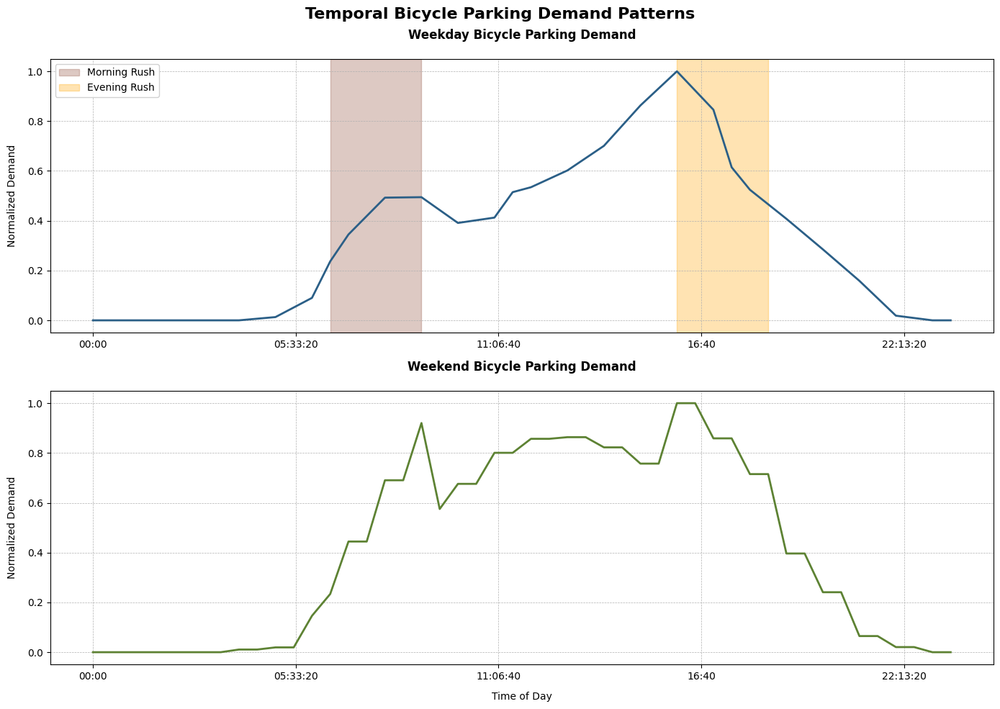

In [ ]:
amenities = gpd.read_file('final_amenities.geojson')
parking = pd.read_excel('fietsenstallingen.xlsx')

analyzer = TemporalAnalyzer(amenities, parking)
profiles = analyzer.generate_demand_profiles()
analyzer.visualize_profiles(profiles)

### Traffic Analysis

Now that we have done a temporal analysis of the user traffic, creating a weekday and weekend profile, which would help us establish our services, we need to determine optimal placement for charging stations in the hubs of our start-up.

To do that we begin by analyzing the routes people would take based on the amenities and their favourability to the users. Amenities include schools, universities, shops, healthcare facilites (specfically the Catherina hospital and Maxima MC), restaurants, parks and recreational spots, museums. We have done this route analysis based on the theortical weights of amenities, emphasizing their popularity and how much fleet demand they would hypothetically require. For example we have increased weights for:

TU/e (2.5 - major employer/education hub)

Hospitals (2.3-2.5 - essential services)

Train stations (added at 2.4)

Standardized casing for same things with different notations

Sources: https://dutchcycling.nl/ (for the recreational weighing)
https://www.tue.nl/en/our-university/about-the-university/sustainability/operations/smart-green-mobility/mobility (TU/e weight + other schools)

Catharina sees 4,000+ daily visitors (city data)


How the code works:

This code performs spatial network analysis to model bicycle traffic patterns based on proximity to amenities, without using machine learning. It constructs a graph of bike lanes using NetworkX, snaps amenities (e.g., schools, hospitals) and starting points to the nearest nodes, and simulates bike traffic by calculating shortest paths between them, weighted by amenity importance (e.g., hospitals score higher than cafes). Gaps in the bike network are bridged using geometric operations (Shapely), and spatial indexing (BallTree) efficiently connects nearby segments. The result is a geospatial visualization of high-traffic routes, derived from graph theory and deterministic spatial algorithms—not ML.


In [ ]:
import geopandas as gpd
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import LineString, Point, Polygon # Import Polygon
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import contextily as ctx
from sklearn.neighbors import BallTree # Import BallTree

# Load the GeoJSON files
bike_lanes = gpd.read_file('bike_lanes.geojson')
amenities = gpd.read_file('final_amenities.geojson')
starting_points = gpd.read_file('starting_points_on.geojson')

# Convert to projected CRS - better for distance measuring
if bike_lanes.crs != 'EPSG:28992':
    bike_lanes = bike_lanes.to_crs('EPSG:28992')  # Dutch projected system
    amenities = amenities.to_crs('EPSG:28992')
    starting_points = starting_points.to_crs('EPSG:28992')

# Filter amenities to include only Point geometries
amenities = amenities[amenities.geometry.apply(lambda geom: isinstance(geom, Point))]

# Add weights to amenities
amenity_weights = {
    # Education (high priority)
    'Tu/e': 2.5,        # Technical University (major trip generator) [1,2]
    'school': 2.0,      # Primary/secondary schools [3]

    # Healthcare (high priority)
    'Maxima mc': 2.5,   # Major hospital [4]
    'Catherina': 2.3,   # Catharina Hospital [4]

    # Commercial/Central
    'Centrum': 2.2,     # City center (mixed destinations) [5]
    'restaurant': 1.7,  # [6]
    'cafe': 1.6,        # [6]
    'shop': 1.5,        # [5]
    'Shop': 1.5,        # standardized casing

    # Recreation
    'park': 1.3,        # [7]
    'Park': 1.3,        # standardized casing
    'sport': 1.4,       # Sports facilities [8]

}

# Assign weights to amenities (default to 1.0 if type not specified)
amenities['weight'] = amenities['name'].apply(lambda x: amenity_weights.get(x, 1.0))

# Create the bicycle network graph
G = nx.Graph()

# Add all bike lane segments as edges
for idx, row in bike_lanes.iterrows():
    line = row['geometry']
    if isinstance(line, LineString):
        # Get all points in the LineString
        points = list(line.coords)

        # Add edges between consecutive points
        for i in range(len(points)-1):
            start = points[i]
            end = points[i+1]
            length = Point(start).distance(Point(end))
            G.add_edge(start, end, length=length, geometry=LineString([start, end]))

# Add amenities and starting points as nodes
for idx, row in amenities.iterrows():
    # Ensure geometry is a Point before accessing x, y
    if isinstance(row.geometry, Point):
        point = (row.geometry.x, row.geometry.y)
        G.add_node(point, type='amenity', weight=row['weight'], name=row.get('name', ''))

for idx, row in starting_points.iterrows():
    # Ensure geometry is a Point before accessing x, y
    if isinstance(row.geometry, Point):
        point = (row.geometry.x, row.geometry.y)
        G.add_node(point, type='start', name=row.get('name', ''))

def connect_nearby_segments(graph, max_gap=50):
    """Connect segments that are within max_gap meters of each other since the original dataset is too fragmented"""
    nodes = np.array(list(graph.nodes()))
    if len(nodes) < 2:
        return

    tree = BallTree(nodes, metric='euclidean')

    # For each node, find nearby nodes not already connected
    for node in graph.nodes():
        # Find all nodes within max_gap distance
        indices = tree.query_radius([node], r=max_gap)[0]

        for idx in indices:
            other_node = tuple(nodes[idx])
            if other_node != node and not graph.has_edge(node, other_node):
                length = Point(node).distance(Point(other_node))
                graph.add_edge(
                    node, other_node,
                    length=length,
                    geometry=LineString([node, other_node]),
                    type='gap_fill'
                )

# Connect segments up to 50 meters apart
connect_nearby_segments(G, max_gap=50)

# Snap amenities/starts to nearest bike lane node since some amenities and starting points are not on the bike grid/graph
def snap_points_to_graph(graph, points_gdf):
    nodes = np.array(list(graph.nodes()))
    if nodes.size == 0:
        return []  # Return empty list if no nodes in the graph

    tree = BallTree(nodes, metric='euclidean')
    snapped_coords = []
    valid_points = []
    for point in points_gdf.geometry:
        # Ensure geometry is a Point before querying
        if isinstance(point, Point):
            valid_points.append([point.x, point.y])

    if not valid_points:
        return [] # Return empty list if no valid points

    valid_points_array = np.array(valid_points)
    _, indices = tree.query(valid_points_array, k=1)

    for idx in indices:
        snapped_coords.append(tuple(nodes[idx[0]]))

    return snapped_coords


amenity_nodes = snap_points_to_graph(G, amenities)
start_nodes = snap_points_to_graph(G, starting_points)



#  Find nearest nodes for amenities and starting points in the graph
def find_nearest_node(graph, point):
    # Ensure input point is a Point object
    if not isinstance(point, Point):
        return None # Or raise an error, depending on desired behavior

    point_coords = (point.x, point.y)
    nodes = np.array(list(graph.nodes()))
    # Add a check for empty nodes array
    if nodes.size == 0:
        return None

    distances = np.sum((nodes - point_coords)**2, axis=1)
    nearest_node = tuple(nodes[np.argmin(distances)])
    return nearest_node

# Calculate routes and accumulate traffic
edge_counts = {}
for edge in G.edges():
    edge_counts[edge] = 0

for _, start_row in starting_points.iterrows():
    start_point = start_row.geometry
    start_node = find_nearest_node(G, start_point)

    # Ensure start_node is not None (if find_nearest_node returned None)
    if start_node is None:
        continue

    for _, amenity_row in amenities.iterrows():
        amenity_point = amenity_row.geometry
        amenity_node = find_nearest_node(G, amenity_point)

        # Ensure amenity_node is not None
        if amenity_node is None:
             continue

        try:
            # Find shortest path
            path = nx.shortest_path(G, start_node, amenity_node, weight='length')

            # Add the amenity weight to all edges in this path
            for i in range(len(path)-1):
                u, v = path[i], path[i+1]
                # Find the actual edge in the graph that corresponds to this segment
                # This handles potential floating point differences in node representation
                found_edge = None
                for edge in G.edges(data=True):
                    if (edge[0] == u and edge[1] == v) or (edge[0] == v and edge[1] == u):
                        found_edge = (edge[0], edge[1])
                        break
                if found_edge:
                    edge_counts[found_edge] += amenity_row['weight']
                else:
                    print(f"Warning: Edge between {u} and {v} not found in graph edges. Skipping.")

        except nx.NetworkXNoPath:
            continue

# Create a GeoDataFrame for visualization
edges_gdf = gpd.GeoDataFrame(columns=['geometry', 'weight'], crs=bike_lanes.crs)

for edge, count in edge_counts.items():
    if count > 0:  # Only include used edges
        # Find the geometry for this edge
        geom = G.edges[edge]['geometry']
        edges_gdf.loc[len(edges_gdf)] = {'geometry': geom, 'weight': count}

# Normalize weights for visualization
if not edges_gdf.empty: # Check if edges_gdf is not empty before normalizing
    max_weight = edges_gdf['weight'].max()
    if max_weight > 0:
         edges_gdf['normalized_weight'] = edges_gdf['weight'] / max_weight
    else:
         edges_gdf['normalized_weight'] = 0 # Handle case where all weights are 0
else:
    edges_gdf['normalized_weight'] = 0 # Add column even if empty



print(f"Total edges with traffic: {len(edges_gdf)}")
print(f"Max weight: {edges_gdf['weight'].max() if not edges_gdf.empty else 0}")
print(f"Is graph connected? {nx.is_connected(G)}")
print(f"Number of connected components: {nx.number_connected_components(G)}")
# Check network connectivity
print(f"Number of disconnected components: {nx.number_connected_components(G)}")
components = list(nx.connected_components(G))
print(f"Component sizes: {[len(c) for c in components]}")

Total edges with traffic: 2273
Max weight: 97.00000000000004
Is graph connected? False
Number of connected components: 180
Number of disconnected components: 180
Component sizes: [20820, 3, 3, 2, 16, 5, 2, 3, 4, 4, 3, 11, 6, 4, 4, 4, 6, 3, 5, 8, 8, 13, 2, 7, 2, 2, 5, 42, 4, 9, 23, 7, 2, 2, 5, 2, 2, 5, 10, 9, 9, 6, 9, 2, 17, 5, 2, 5, 2, 13, 20, 7, 36, 25, 4, 6, 4, 7, 9, 4, 13, 5, 7, 2, 4, 5, 2, 2, 10, 6, 4, 9, 12, 5, 3, 5, 2, 7, 10, 12, 2, 12, 4, 4, 3, 38, 3, 11, 8, 2, 2, 39, 16, 4, 11, 51, 9, 3, 2, 5, 4, 9, 4, 4, 2, 3, 3, 2, 4, 3, 6, 2, 3, 2, 4, 4, 2, 18, 5, 6, 2, 5, 9, 4, 3, 24, 4, 11, 4, 17, 8, 3, 14, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


Below is a simple visualization of the results of the computation.

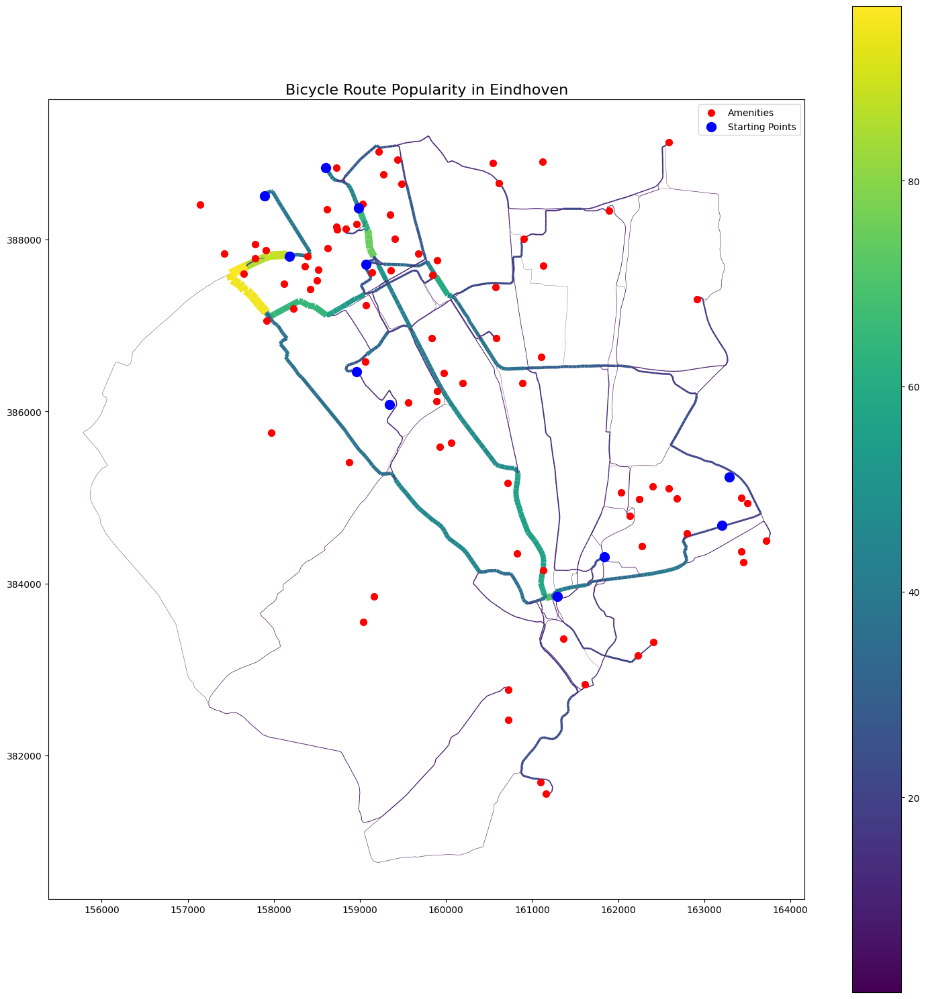

In [ ]:
# Simple visualization

fig, ax = plt.subplots(figsize=(15, 15))

# Plot the base map (Eindhoven)
if not edges_gdf.empty: # Only plot if edges_gdf is not empty
    edges_gdf.plot(ax=ax, linewidth=0.5, color='lightgray', zorder=1)

    # Plot the routes with width and color based on weight
    edges_gdf.plot(
        ax=ax,
        linewidth=edges_gdf['normalized_weight'] * 10,  # Scale line width
        cmap='viridis',  # Color map
        column='weight',  # Values to color by
        legend=True,
        zorder=2
    )

# Plot amenities
amenities.plot(ax=ax, color='red', markersize=50, zorder=3, label='Amenities')

# Plot starting points
starting_points.plot(ax=ax, color='blue', markersize=100, zorder=4, label='Starting Points')

if bike_lanes.crs is not None:
    edges_gdf.crs = bike_lanes.crs


# Add legend and title
ax.legend()
ax.set_title('Bicycle Route Popularity in Eindhoven', fontsize=16)
plt.tight_layout()
plt.show()

Below is a cleaned up version of the visualization, ready for the report.

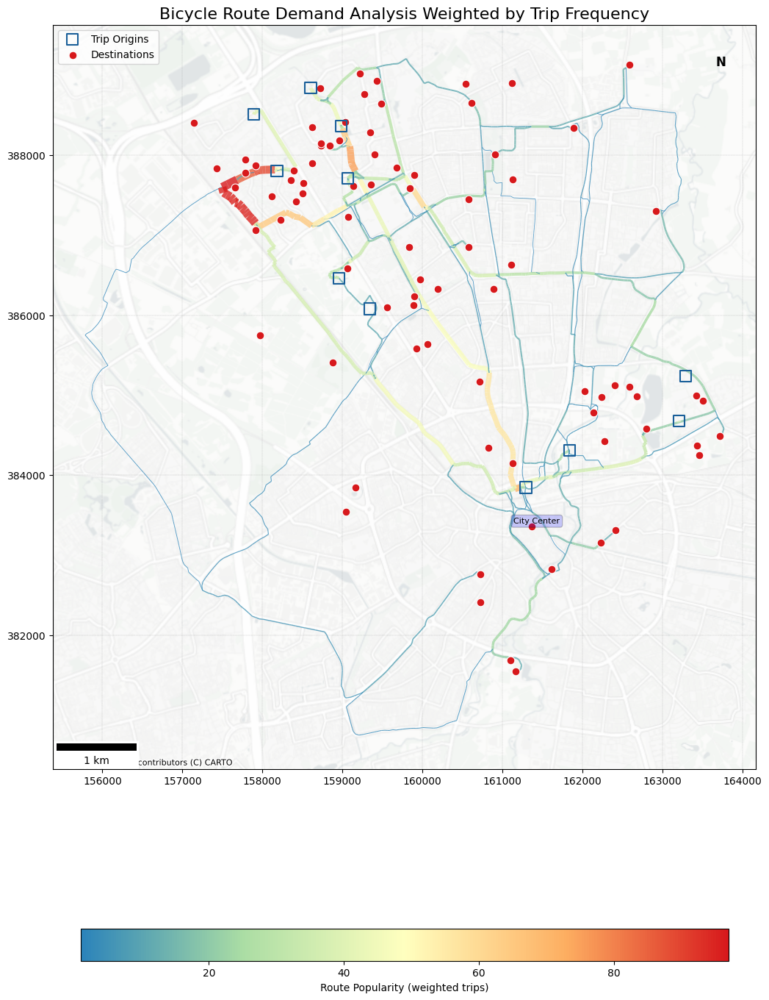

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar # Import ScaleBar

fig, ax = plt.subplots(figsize=(15, 15))

# Create a custom colormap (blue to red)
cmap = LinearSegmentedColormap.from_list("traffic", ["#2b83ba", "#abdda4", "#ffffbf", "#fdae61", "#d7191c"])

# Plot routes with styling
if not edges_gdf.empty:
    edges_gdf.plot(
        ax=ax,
        column='weight',
        cmap=cmap,
        linewidth=edges_gdf['normalized_weight'] * 8 + 0.5,  # Dynamic width
        alpha=0.8,  # Transparency
        legend=True,
        zorder=2,
        legend_kwds={
            'label': "Route Popularity (weighted trips)",
            'shrink': 0.6,
            'orientation': 'horizontal'
        }
    )

# Plot starting points (blue squares with edge)
starting_points.plot(
    ax=ax,
    color='none',  # No fill
    edgecolor='#1a5f99',
    marker='s',
    markersize=120,
    linewidth=1.5,
    zorder=4,
    label='Trip Origins'
)

# Plot amenities (red circles with white edge)
amenities.plot(
    ax=ax,
    color='#d7191c',
    edgecolor='white',
    markersize=60,
    linewidth=0.8,
    zorder=3,
    label='Destinations'
)

# Add a light-themed basemap (no distracting labels)
ctx.add_basemap(
    ax,
    crs=bike_lanes.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
    alpha=0.7  # Slightly transparent
)

# Add scale bar and north arrow
ax.add_artist(ScaleBar(1, location='lower left'))  # 1 meter units
ax.text(0.95, 0.95, 'N', transform=ax.transAxes, ha='center', va='center',
        fontsize=12, weight='bold')

# Set title and legend
ax.set_title(
    "Eindhoven Bicycle Route Demand Analysis\nWeighted by Trip Frequency",
    fontsize=14,
    pad=20,
    weight='bold'
)
ax.legend(
    loc='upper right',
    frameon=True,
    framealpha=0.9,
    edgecolor='white'
)

ax.grid(
    which='major',
    linestyle='--',
    color='gray',
    linewidth=0.3,
    alpha=0.5
)

# Label key areas ("City Center")
ax.annotate(
     'City Center',
     xy=(161430, 383400),
     xytext=(161430, 383400),
     ha='center',
     arrowprops=dict(arrowstyle='->', color='white'),
     fontsize=8,
     bbox=dict(boxstyle='round', alpha=0.2, facecolor='blue')
)

ax.legend()
ax.set_title('Bicycle Route Demand Analysis Weighted by Trip Frequency', fontsize=16)
plt.tight_layout()
plt.show()

## Station Locations

After user analysis and behaviour overview, we need to compile all the data we have collected, along with the city infrastructure data, in order to find the optimal places for charging stations for our start-up.

There are thing we have taken into account while looking for data in terms of the voltage needed for each station, etc., such as:

1. Low-Voltage Network (230/400 V)
Most e-bike charging stations can be connected to the low-voltage grid. This voltage level supports small to medium loads typical for e-bike chargers (https://research.tudelft.nl/en/publications/sustainable-e-bike-charging-station-that-enables-ac-dc-andwireles).

Standard Requirements:

230 V for individual charging points (typical home socket voltage).

400 V (three-phase) for stations with multiple charging points. This is common for commercial applications and supports higher loads.

Power Estimate per Charger:

A typical e-bike battery charger draws 50–300 W per bike, depending on the charger type and battery size.

Example Configuration:

10 bikes simultaneously charging at 300 W each = 3 kW total load.

This is well within the capacity of a standard 400 V, three-phase 16 A connection, which provides up to 11.5 kW (https://publications.tno.nl/publication/34636220/5UgNFC/valckenborg-2017-design.pdf).

2. When to Consider Medium-Voltage Grid Access
We would only need medium-voltage access (10–50 kV) for an extremely large charging station or if combined with other high-load facilities (e.g., electric car chargers or large battery storage systems).

Medium-voltage access is rare for e-bike stations and involves:

Dedicated transformers to step down to usable voltages.

Higher installation and maintenance costs.

The network of low-voltage flows is restricted, as it is reserved for private/small business uses. Thus, we have employed a different tactic to incur whether the places we need are supplied with enough electricty to be of proper use.

We have taken PDOK's map, detailing the Eindhoven's grid, accounting for the establishmemtn of charging stations of 25kV capacity and higher, placing them in the mid- to high-voltage range (https://nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/map). However, they give a very insightful overview of the grid network and its span. Next, we have a map, containg all private and public electric car charging stations. We are going to overlap the two maps to see optimal locations and draw lines between the points to see the extent of the electrical grid system, which are supplied with enough electricity and in a close proximity to the charging stations to ensure no need for extending the existing network too much, in order to cut down on costs.

Why we didnt use the detailed electricity grid system - cost money and its 2GB, almost fried my laptop

Overall: there is enough supply for low-voltage stations, also by extending lamp posts for voltage consumption, so what we are doing in the following boxes is complimentary analysis of the grid for precision.

In the end, we have consulted Enexis, Eindhoven's electricity supplier, and their capacity map, which outlines areas, which are capable of servicing additions to the transportation electrical grid (https://data.partnersinenergie.nl/capaciteitskaart/rnb/afname). This is to confirm is the stations we have elected are actually feasible with respect to the already existing electricity consumption in these areas.

**Note:** Previously, we were going to employ a regulation that existing stations should be more than 300m away from any new station to be established, unless there is enough traffic to justify otherwise. However, upon further investigation, this municipality regulation applies only to charging stations of motor vehicles, a.k.a. cars. Thus, there are no regulations regarding the placement of e-bike charging hubs.

<ipython-input-14-2fda25aef96b>:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  charging_stations.geometry.centroid.plot(ax=ax, color='blue', markersize=40)


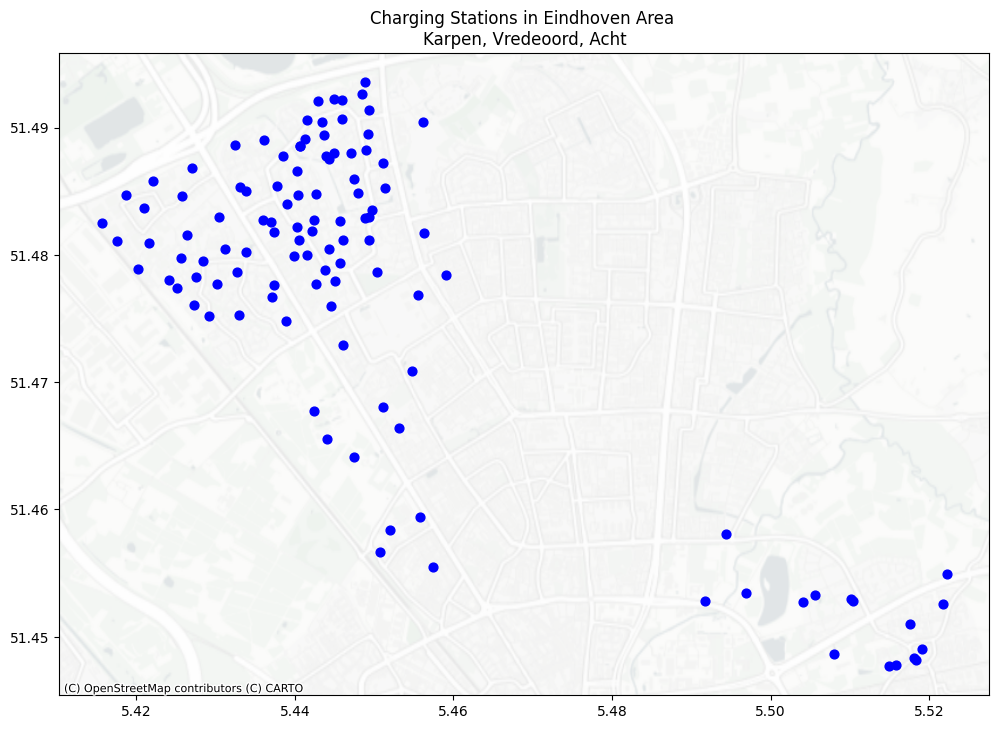

In [ ]:
# plot the electrical grid with low voltage pls overlayed
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
from shapely.geometry import LineString
import numpy as np
import contextily as ctx # Import contextily

# Load the GeoJSON file
charging_stations = gpd.read_file('eindhoven.geojson')

# Create a basic plot
fig, ax = plt.subplots(figsize=(12, 10))
charging_stations.geometry.centroid.plot(ax=ax, color='blue', markersize=40)
# Add a light-themed basemap (no distracting labels)
ctx.add_basemap(
    ax,
    crs=charging_stations.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
    alpha=0.7  # Slightly transparent
)
plt.title('Charging Stations in Eindhoven Area \nKarpen, Vredeoord, Acht')
plt.show()



<ipython-input-17-b3ff1a703ba2>:33: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  charging_stations.geometry.centroid.plot(ax=ax, color='blue', markersize=50, label='Charging Stations')


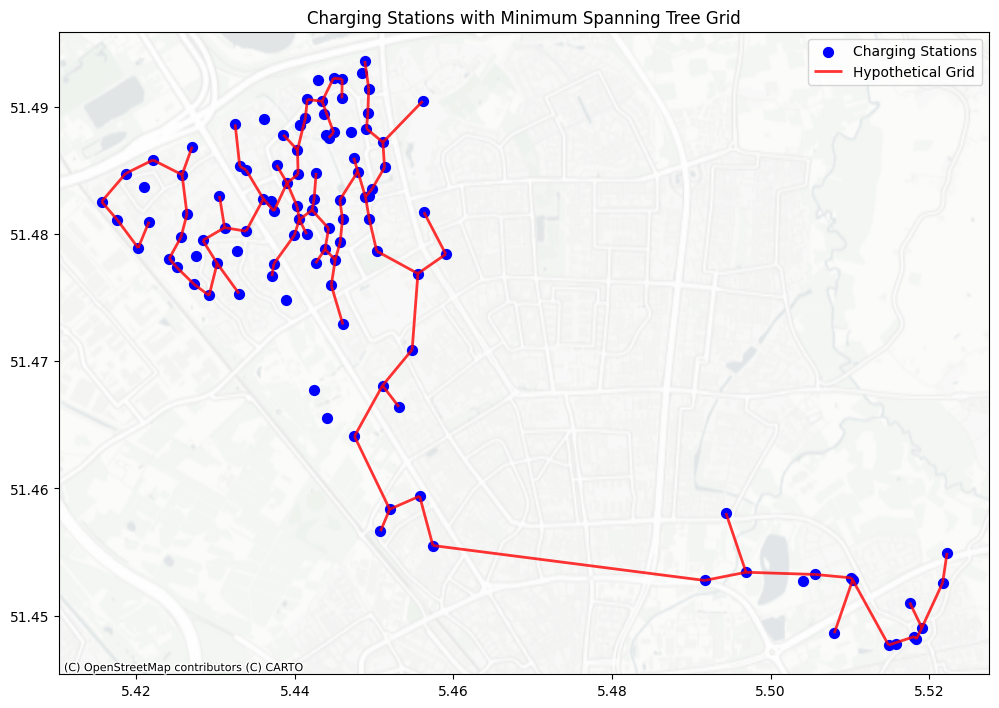

In [ ]:
# Generate electricity grid
# Create a graph where stations are nodes
G = nx.Graph()

# Add nodes with their positions, filtering for Point geometries
for idx, row in charging_stations.iterrows():
    if row.geometry.geom_type == 'Point': # Filter for Point geometries
        G.add_node(idx, pos=(row.geometry.x, row.geometry.y))

# Calculate all pairwise distances and add edges
positions = nx.get_node_attributes(G, 'pos')
for n1 in G.nodes():
    for n2 in G.nodes():
        if n1 < n2:  # Avoid duplicate edges
            # Euclidean distance between points
            dist = np.sqrt((positions[n1][0] - positions[n2][0])**2 +
                          (positions[n1][1] - positions[n2][1])**2)
            G.add_edge(n1, n2, weight=dist)

# Create minimum spanning tree (efficient hypothetical grid)
mst = nx.minimum_spanning_tree(G)

# Convert the MST to GeoDataFrame
lines = []
for edge in mst.edges():
    line = LineString([positions[edge[0]], positions[edge[1]]])
    lines.append(line)

grid = gpd.GeoDataFrame(geometry=lines, crs=charging_stations.crs)

# Plot stations and grid
fig, ax = plt.subplots(figsize=(12, 10))
charging_stations.geometry.centroid.plot(ax=ax, color='blue', markersize=50, label='Charging Stations')
ctx.add_basemap(
    ax,
    crs=charging_stations.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
    alpha=0.7  # Slightly transparent
)
grid.plot(ax=ax, color='red', linewidth=2, alpha = 0.8, label='Hypothetical Grid')
plt.title('Charging Stations with Minimum Spanning Tree Grid')
plt.legend()
plt.show()

Further explanation of the marked areas below:

Available but busy - indicated where establishing new tranposrt electricity grid is possible but because of traffic, not immediately available

Not any special requirement - free to use the available grid

Impossible area - due to traffic there are not any requests from Enexis being accepted for new transport stations

<ipython-input-36-44797671a05e>:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  charging_stations.geometry.centroid.plot(


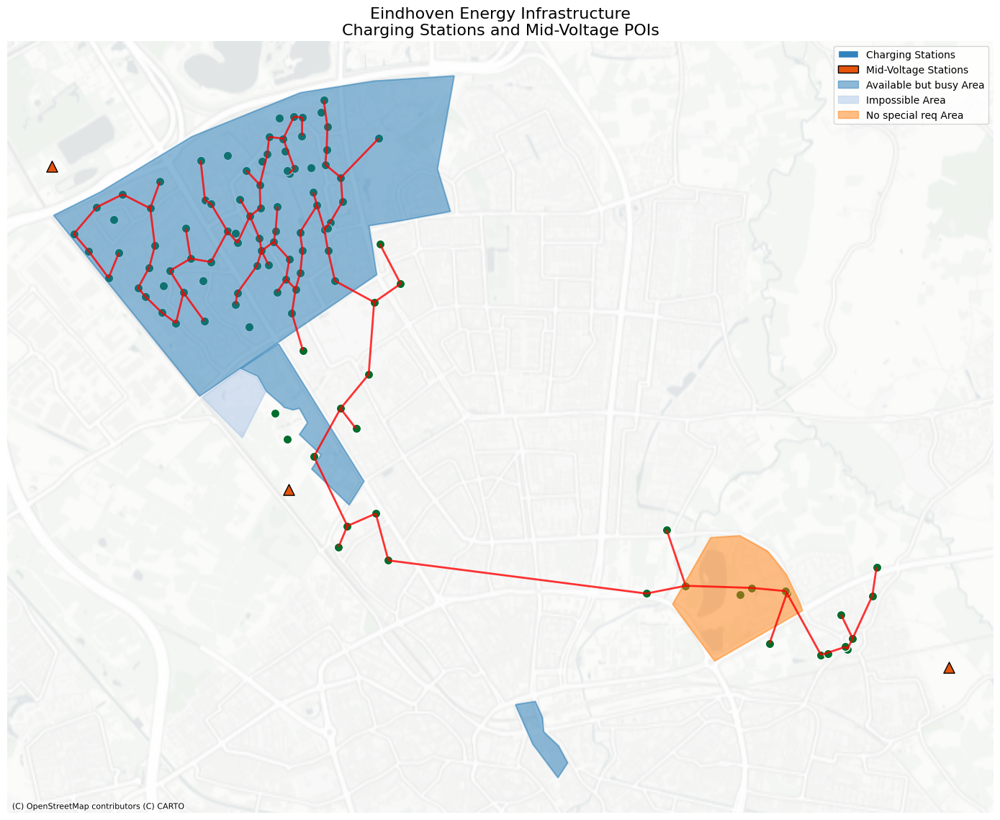

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches


charging_stations = gpd.read_file('eindhoven.geojson')
midvoltage_data = gpd.read_file('electricity_grid.geojson')

# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 12))

# First plot the charging stations (points)
charging_stations.geometry.centroid.plot(
    ax=ax,
    color='#006d2c',  # Blue color
    markersize=80,
    marker='o',  # Circle marker
    edgecolor='white',
    linewidth=1,
    label='Charging Stations'
)

# Plot mid-voltage POINTS with different style
midvoltage_points = midvoltage_data[midvoltage_data.geometry.type == 'Point']
midvoltage_points.plot(
    ax=ax,
    color='#e6550d',  # Orange color
    markersize=120,
    marker='^',  # Triangle marker
    edgecolor='black',
    linewidth=1,
    label='Mid-Voltage Stations'
)

# Plot mid-voltage POLYGONS with custom styling
midvoltage_polygons = midvoltage_data[midvoltage_data.geometry.type == 'Polygon']

# Create a color mapping based on the 'name' attribute
unique_names = midvoltage_polygons['name'].unique()
colors = plt.cm.tab20.colors  # Using a colormap with 20 distinct colors
name_color_map = {name: colors[i % len(colors)] for i, name in enumerate(unique_names)}

# Plot each polygon with its assigned color
for name, color in name_color_map.items():
    subset = midvoltage_polygons[midvoltage_polygons['name'] == name]
    subset.plot(
        ax=ax,
        color=color,
        alpha=0.5,  # Semi-transparent
        edgecolor=color,
        linewidth=1.5,
        label=f'{name} (area)'
    )

# Create custom legend handles
legend_handles = [
    mpatches.Patch(facecolor='#3182bd', edgecolor='white', label='Charging Stations'),
    mpatches.Patch(facecolor='#e6550d', edgecolor='black', label='Mid-Voltage Stations'),
]

# Add legend entries for polygon types
for name, color in name_color_map.items():
    legend_handles.append(
        mpatches.Patch(facecolor=color, alpha=0.5, edgecolor=color, label=f'{name} Area')
    )
ctx.add_basemap(
    ax,
    crs=charging_stations.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
    alpha=0.7  # Slightly transparent
)
# Add legend
ax.legend(handles=legend_handles, loc='upper right')

# Customize the plot
ax.set_title('Eindhoven Energy Infrastructure\nCharging Stations and Mid-Voltage POIs', fontsize=16)
ax.set_axis_off()  # Turn off axis for cleaner look
grid.plot(ax=ax, color='red', linewidth=2, alpha = 0.8, label='Hypothetical Grid')
plt.tight_layout()
plt.show()

Show priority locations, near bus stops and high priority spots, where many amenities are located together, such as shopping centres and entertainment districts.

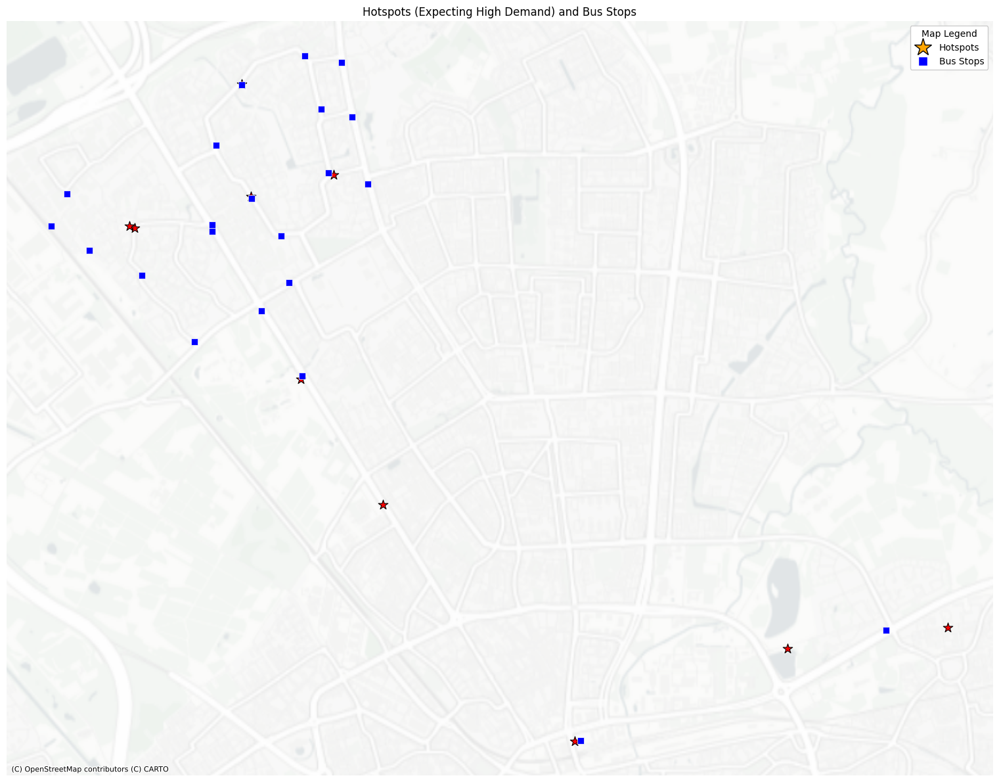

In [ ]:
# showing bus stops
# bus stop and "high" - high priority where we can add a statoin since its high demand
# let me add frequently visited spots (with high) but outside the bus stations as well

import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.lines import Line2D # Import Line2D
import contextily as ctx # Import contextily

# Load the additional dataset
bus_points = gpd.read_file('bus_stops_1.geojson')

# Create figure and axis
fig, ax = plt.subplots(figsize=(16, 12))


# Plot the new points with categorization
# Separate points by type
hotspots = bus_points[bus_points['name'] == 'high']
bus_stops = bus_points[bus_points['name'] == 'bus stop']

# Plot hotspots
hotspots.plot(
    ax=ax,
    color='#ff0000',  # Bright red
    markersize=120,
    marker='*',  # Star marker
    edgecolor='black',
    linewidth=0.8,
    label='Hotspots'
)

# Plot bus stops
bus_stops.plot(
    ax=ax,
    color='#0000ff',  # Blue
    markersize=60,
    marker='s',  # Square marker
    edgecolor='white',
    linewidth=0.5,
    label='Bus Stops'
)

# Add basemap
if 'charging_stations' in locals() and charging_stations.crs is not None:
     ctx.add_basemap(
        ax,
        crs=charging_stations.crs.to_string(),
        source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
        alpha=0.7  # Slightly transparent
    )
elif 'grid' in locals() and grid.crs is not None:
     ctx.add_basemap(
        ax,
        crs=grid.crs.to_string(),
        source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
        alpha=0.7  # Slightly transparent
    )


# Update the legend
# Include existing legend elements and add new ones for hotspots and bus stops
legend_elements = []




legend_elements.extend([
    Line2D([0], [0], marker='*', color='w', label='Hotspots',
          markerfacecolor='orange', markersize=20, markeredgecolor='black'),
    Line2D([0], [0], marker='s', color='w', label='Bus Stops',
          markerfacecolor='blue', markersize=10, markeredgecolor='white')
])

plt.legend(
    handles=legend_elements,
    title='Map Legend',
    # bbox_to_anchor=(1.25, 1), # Adjust position if needed
    loc='upper right',
    frameon=True,
    framealpha=1
)

# Add title and customize plot
plt.title('Hotspots (Expecting High Demand) and Bus Stops')
ax.set_axis_off()  # Turn off axis for cleaner look
# Adjust layout and display
plt.tight_layout()
plt.show()

Identify top spots for hubs  by proximity rule of near car stations (300 meters) to cut down on costs. If there is an established station nearby, and the area is OK-ed by the other maps we have, then a station should be possible to be added there.

**Advantages of Proximity to Car Charging Stations**

Grid Accessibility:

Car charging stations are typically connected to the low-voltage grid, which can also support e-bike charging. Being near an existing station increases the likelihood of grid access.

User Convenience:

Combining e-bike and car charging in close proximity enhances convenience for multi-modal users (e.g., those who park their car and then use an e-bike for short-distance travel).

Zoning and Infrastructure:

Locations with car charging stations are often already zoned and designed for charging infrastructure, potentially simplifying permitting for e-bike stations.

Cost Efficiency:

Proximity to an existing station may reduce connection costs, as the necessary grid infrastructure (transformers, cabinets) is likely nearby.

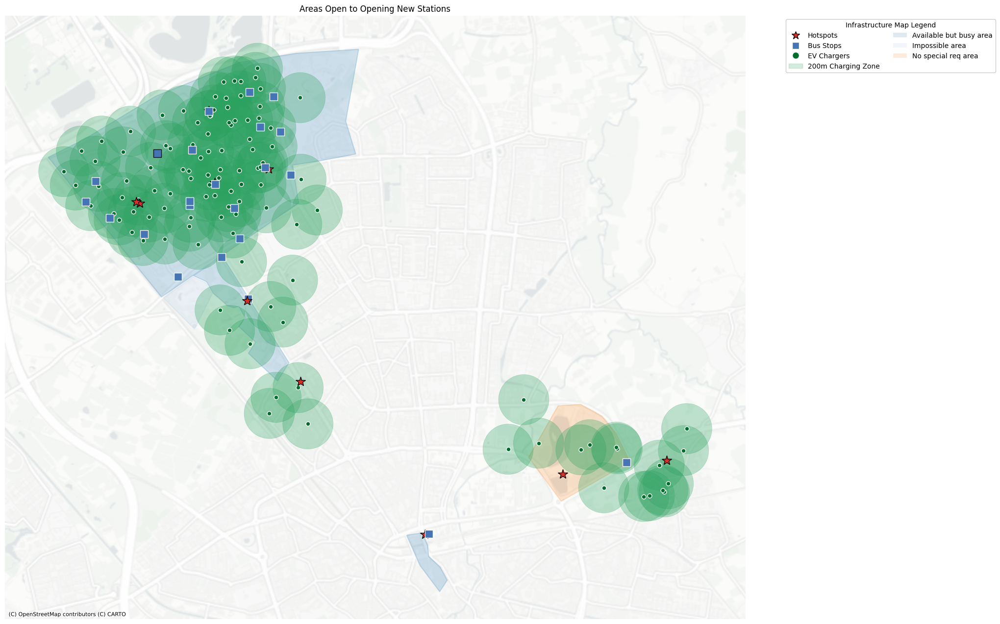

In [ ]:
#write algorithm that identifies top spots on the graph for station
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, to_hex
import matplotlib.patches as mpatches
from shapely.geometry import Point, Polygon
import numpy as np
from matplotlib.lines import Line2D # Import Line2D
import contextily as ctx # Import contextily

# Load all datasets
charging_stations = gpd.read_file('eindhoven.geojson')
midvoltage = gpd.read_file('electricity_grid.geojson')
transport_points = gpd.read_file('bus_stops_1.geojson')  # Contains 'high' and 'bus stop'


charging_stations = charging_stations.to_crs('EPSG:28992')
midvoltage = midvoltage.to_crs('EPSG:28992')
transport_points = transport_points.to_crs('EPSG:28992')



# Create buffers (50 radius - crs must be meters cuz crazy otherwise)
charging_buffers = charging_stations.copy()
charging_buffers['geometry'] = charging_stations.geometry.centroid.buffer(300)

# Create figure
fig, ax = plt.subplots(figsize=(20, 16))

# Plot mid-voltage POLYGONS with custom styling
midvoltage_polygons = midvoltage[midvoltage.geometry.type == 'Polygon']

# Create a color mapping based on the 'name' attribute
unique_names = midvoltage_polygons['name'].unique()
colors = plt.cm.tab20.colors  # Using a colormap with 20 distinct colors
name_color_map = {name: colors[i % len(colors)] for i, name in enumerate(unique_names)}

# Plot each polygon with its assigned color
for name, color in name_color_map.items():
    subset = midvoltage_polygons[midvoltage_polygons['name'] == name]
    subset.plot(
        ax=ax,
        color=color,
        alpha=0.2,  # Semi-transparent
        edgecolor=color,
        linewidth=1.5,
        label=f'{name} (area)'
    )

#  Plot charging station buffers
charging_buffers.plot(
    ax=ax,
    color='#2ca25f',
    alpha=0.3,
    edgecolor='#2ca25f',
    linewidth=0.5,
    label='300m Charging Zone'
)

# Plot transport points (combined hotspots and bus stops)
transport_points['color'] = np.where(transport_points['name'] == 'high', '#d73027', '#4575b4')
transport_points['marker'] = np.where(transport_points['name'] == 'high', '*', 's')
transport_points['size'] = np.where(transport_points['name'] == 'high', 15, 12)

for idx, row in transport_points.iterrows():
    ax.plot(
        row.geometry.x,
        row.geometry.y,
        marker=row['marker'],
        color=row['color'],
        markersize=row['size'],
        markeredgecolor='white' if row['name'] == 'bus stop' else 'black',
        linestyle='none'
    )

#  Plot charging stations and mid-voltage infrastructure
charging_stations.geometry.centroid.plot(
    ax=ax,
    color='#006d2c',
    markersize=40,
    marker='o',
    edgecolor='white',
    label='EV Chargers'
)

ctx.add_basemap(
    ax,
    crs=charging_stations.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
    alpha=0.7  # Slightly transparent
)

# Create custom legend with logical grouping
legend_elements = [
    # Transportation
    Line2D([0], [0], marker='*', color='w', label='Hotspots',
          markerfacecolor='#d73027', markersize=12, markeredgecolor='black'),
    Line2D([0], [0], marker='s', color='w', label='Bus Stops',
          markerfacecolor='#4575b4', markersize=10, markeredgecolor='white'),

    # Charging infrastructure
    Line2D([0], [0], marker='o', color='w', label='EV Chargers',
          markerfacecolor='#006d2c', markersize=10, markeredgecolor='white'),
    mpatches.Patch(facecolor='#2ca25f', alpha=0.2, label='200m Charging Zone',
                 edgecolor='#2ca25f'),

    # Network areas
    *[mpatches.Patch(facecolor=color, alpha=0.15, label=f'{name} area')
     for name, color in name_color_map.items()]
]

# Create multi-column legend
plt.legend(
    handles=legend_elements,
    title='Infrastructure Map Legend',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    frameon=True,
    framealpha=1,
    ncol=2  # Two-column legend
)

plt.title('Areas Open to Opening New Stations')
ax.set_axis_off()  # Turn off axis for cleaner look

Overlaying the maps of the grid analysis and the route prediction map, yields the following spots:

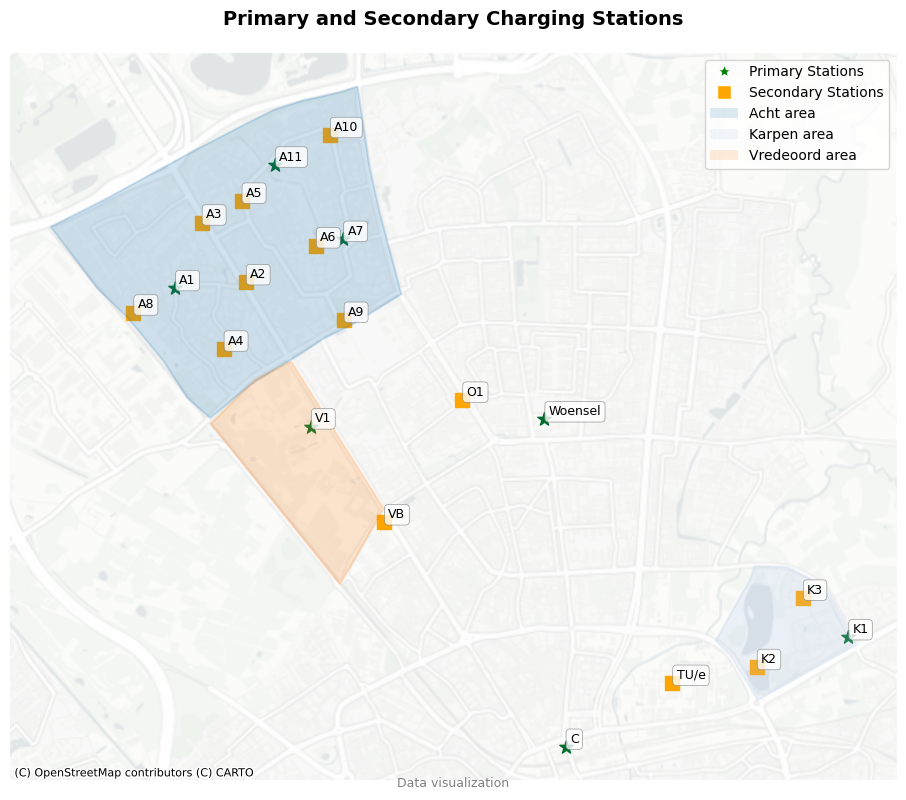

,Name,Type,Latitude,Longitude
0,A1,primary,51.479258,5.428384
1,A2,secondary,51.479712,5.437138
2,A3,secondary,51.484333,5.431682
3,A4,secondary,51.474581,5.434392
4,A5,secondary,51.486020,5.436623
5,A6,secondary,51.482559,5.445829
6,A7,primary,51.483060,5.449208
7,A8,secondary,51.477374,5.423212
8,A9,secondary,51.476799,5.449262
9,A10,secondary,51.491094,5.447572


In [ ]:
# propose stations
import json
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.patches as mpatches
import contextily as ctx # Import contextily
from matplotlib.lines import Line2D # Import Line2D

hubs = gpd.read_file('ev_stations.geojson')
og_c = hubs.crs
hubs = hubs.to_crs('EPSG:28992')

# Filter for Point geometries (stations) to extract coordinates
point_hubs = hubs[hubs.geometry.type == 'Point'].copy()
point_hubs = point_hubs.to_crs('EPSG:4326')

# Extract coordinates for the table from the point geometries
point_hubs['longitude'] = point_hubs.geometry.x
point_hubs['latitude'] = point_hubs.geometry.y

# Create a table with coordinates, filtering for relevant types
coord_table = point_hubs[['name', 'description', 'latitude', 'longitude']].copy()
coord_table.columns = ['Name', 'Type', 'Latitude', 'Longitude']
# Filter the table to only include 'primary' and 'secondary' types
coord_table = coord_table[coord_table['Type'].isin(['primary', 'secondary'])]


# Create the plot
plt.figure(figsize=(12, 8))
ax = plt.gca()

# Plot primary points
primary = hubs[hubs['description'].str.contains('primary', case=False, na=False)]
ax = primary.plot(ax=ax, color='#006d2c', marker='*', markersize=100, label='Primary')

# Plot secondary points
secondary = hubs[hubs['description'].str.contains('secondary', case=False, na=False)]
ax = secondary.plot(ax=ax, color='orange', marker='s', markersize=100, label='Secondary')

# plot neighbourhoods
neighb_polygons = hubs[hubs.geometry.type == 'Polygon']

# Create a color mapping based on the 'name' attribute
unique_names = neighb_polygons['name'].unique()
colors = plt.cm.tab20.colors  # Using a colormap with 20 distinct colors
name_color_map = {name: colors[i % len(colors)] for i, name in enumerate(unique_names)}

# Plot each polygon with its assigned color
for name, color in name_color_map.items():
    subset = neighb_polygons[neighb_polygons['name'] == name]
    subset.plot(
        ax=ax,
        color=color,
        alpha=0.2,  # Semi-transparent
        edgecolor=color,
        linewidth=1.5,
        label=f'{name} (area)'
    )

legend_elements = [
    Line2D([0], [0], marker='*', color='w', label='Primary Stations',
          markerfacecolor='green', markersize=10),
    Line2D([0], [0], marker='s', color='w', label='Secondary Stations',
          markerfacecolor='orange', markersize=10),
    # Network areas
    *[mpatches.Patch(facecolor=color, alpha=0.15, label=f'{name} area')
     for name, color in name_color_map.items()]

]


# Add labels to the point geometries (stations)
for idx, row in hubs[hubs.geometry.type == 'Point'].iterrows():
    ax.annotate(text=row['name'], xy=(row.geometry.x, row.geometry.y),
                xytext=(3, 3), textcoords="offset points",
                fontsize=9, bbox=dict(boxstyle="round,pad=0.3",
                fc="white", ec="gray", lw=0.5, alpha=0.8))
ctx.add_basemap(
    ax,
    crs=hubs.crs.to_string(),
    source=ctx.providers.CartoDB.PositronNoLabels,  # Clean gray background
    alpha=0.7  # Slightly transparent
    )
# Customize the plot
ax.set_title('Primary and Secondary Charging Stations', fontsize=14, pad=20, weight = 'bold')
ax.legend(handles=legend_elements, loc='upper right')
ax.set_axis_off()  # For cleaner look without axes

# Add attribution
plt.figtext(0.5, 0.01, "Data visualization", ha="center", fontsize=9, color='gray')

plt.tight_layout()

# Display the plot
plt.show()

# Display the coordinate table with styling
styled_table = (coord_table.style
                .set_caption('Point Coordinates')
                .set_properties(**{'text-align': 'left'})
                .format({'Latitude': '{:.6f}', 'Longitude': '{:.6f}'})
                .background_gradient(cmap='Blues', subset=['Latitude', 'Longitude'])
                .set_table_styles([{'selector': 'caption',
                                  'props': [('font-size', '14px'),
                                           ('font-weight', 'bold'),
                                           ('text-align', 'center')]}]))

display(styled_table)

Now, to improve our simulation, we will create a method to determine which stations would be used the most throughout the day depending on the time vectors used for the temporal analysis, based on the proximity of each station to amenities.


Visit Probabilities by Hour for Each Station:
  name   latitude  longitude  hour_0  hour_1  ...   hour_19   hour_20  \
0   A1  51.479258   5.428384     0.0     0.0  ...  0.143050  0.160435   
1   A2  51.479712   5.437138     0.0     0.0  ...  0.131816  0.141389   
2   A3  51.484333   5.431682     0.0     0.0  ...  0.000000  0.000000   
3   A4  51.474581   5.434392     0.0     0.0  ...  0.047344  0.040973   
4   A5  51.486020   5.436623     0.0     0.0  ...  0.022299  0.021308   

    hour_21   hour_22  hour_23  
0  0.177225  0.000000      0.0  
1  0.147795  0.066601      0.0  
2  0.000000  0.000000      0.0  
3  0.040191  0.049671      0.0  
4  0.018830  0.046121      0.0  

[5 rows x 27 columns]


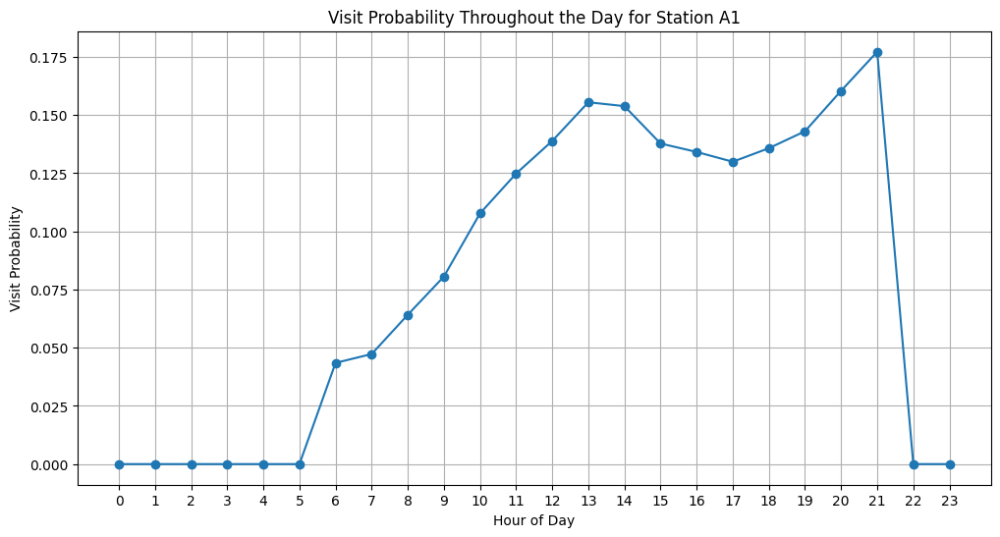

In [ ]:
import numpy as np
import geopandas as gpd
import pandas as pd
from scipy.spatial import KDTree
import matplotlib.pyplot as plt
from shapely import wkt # Import wkt


# Charging stations data (columns: name, latitude, longitude)
hubs = gpd.read_file('ev_stations.geojson')
og_c = hubs.crs
hubs = hubs.to_crs('EPSG:28992') #meters instead of radians

# Filter for Point geometries in hubs
hubs_points = hubs[hubs.geometry.type == 'Point'].copy()


# Amenities data (columns: name, amenity_type, latitude, longitude)
amenities = gpd.read_file('final_amenities.geojson')
amenities = amenities.to_crs('EPSG:28992')

# Filter for Point geometries in amenities
amenities_points = amenities[amenities.geometry.type == 'Point'].copy()


# Extract coordinates from Point objects after converting to a suitable CRS for distance calculation
amenities_4326 = amenities_points.to_crs('EPSG:4326').copy()
amenities_4326['longitude'] = amenities_4326.geometry.x
amenities_4326['latitude'] = amenities_4326.geometry.y

hubs_4326 = hubs_points.to_crs('EPSG:4326').copy()
hubs_4326['longitude'] = hubs_4326.geometry.x
hubs_4326['latitude'] = hubs_4326.geometry.y


# Weight vectors (24 components representing hours 0-23)
weight_vectors = {
    'Shop': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'supermarket': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'shop': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'shops': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'school': [0, 0, 0, 0, 0, 0, 0.5, 1.5, 2.0, 1.8, 0.8, 0.5, 0.3, 0.2, 0.5, 1.2, 1.5, 0.8, 0.3, 0.1, 0, 0, 0, 0],
    'Tu/e': [0, 0, 0, 0, 0, 0, 0.5, 1.5, 2.0, 1.8, 0.8, 0.5, 0.3, 0.2, 0.5, 1.2, 1.5, 0.8, 0.3, 0.1, 0, 0, 0, 0],
    'edu': [0, 0, 0, 0, 0, 0, 0.4, 1.2, 1.5, 1.3, 0.6, 0.4, 0.3, 0.2, 0.4, 1.0, 1.3, 0.6, 0.2, 0.1, 0, 0, 0, 0],
    'Catherina': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 1.0, 1.2, 1.3, 1.3, 1.2, 1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.3, 0.1, 0.1, 0],
    'Maxima mc': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 1.0, 1.2, 1.3, 1.3, 1.2, 1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.3, 0.1, 0.1, 0],
    'huisarts': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 1.0, 1.2, 1.3, 1.3, 1.2, 1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.3, 0.1, 0.1, 0],
    'park': [0, 0, 0, 0, 0, 0, 0.1, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.3, 1.2, 1.0, 0.8, 0.6, 0.4, 0.3, 0.2, 0.1, 0, 0],
    'restaurant': [0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.3, 1.5, 1.6, 1.8, 1.5, 1.2, 1.0, 0.8, 0.5, 0, 0],
    'sport': [0, 0, 0, 0, 0, 0, 0.1, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.3, 1.2, 1.0, 0.8, 0.6, 0.4, 0.3, 0.2, 0.1, 0, 0]
}

## Define Parameters
SEARCH_RADIUS = 400  # meters
EARTH_RADIUS = 6371000  # meters

## Helper Functions
def haversine_distance(lat1, lon1, lat2, lon2):
    """Calculate the great-circle distance between two points on Earth."""
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)

    a = (np.sin(delta_phi/2)**2 +
         np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda/2)**2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return EARTH_RADIUS * c

def find_nearby_amenities(station_lat, station_lon, amenities_df, radius):
    """Find amenities within a given radius of a station."""
    distances = amenities_df.apply(
        lambda row: haversine_distance(station_lat, station_lon, row['latitude'], row['longitude']),
        axis=1
    )
    nearby = amenities_df[distances <= radius].copy()
    nearby['distance'] = distances[distances <= radius]
    return nearby

def calculate_visit_probability(nearby_amenities, weight_vectors, current_hour=None):
    """
    Calculate visit probability based on nearby amenities.
    If current_hour is None, returns probabilities for all 24 hours.
    Otherwise, returns probability for the specified hour.
    """
    if current_hour is not None:
        # Calculate for specific hour
        total_weight = 0
        for _, amenity in nearby_amenities.iterrows():
            amenity_type = amenity['amenity_type']
            if amenity_type in weight_vectors:
                # Inverse distance weighting (closer amenities contribute more)
                weight = weight_vectors[amenity_type][current_hour] * (1 / (amenity['distance'] + 1))
                total_weight += weight
        return total_weight
    else:
        # Calculate for all 24 hours
        hourly_probabilities = np.zeros(24)
        for hour in range(24):
            for _, amenity in nearby_amenities.iterrows():
                amenity_type = amenity['name']
                if amenity_type in weight_vectors:
                    weight = weight_vectors[amenity_type][hour] * (1 / (amenity['distance'] + 1))
                    hourly_probabilities[hour] += weight
        return hourly_probabilities

## Calculate Visit Probabilities for Each Station
# Prepare results dataframe
results = hubs_4326[['name', 'latitude', 'longitude']].copy()

# Add columns for each hour
for hour in range(24):
    results[f'hour_{hour}'] = 0.0

# Process each station
for idx, station in hubs_4326.iterrows():
    nearby_amenities = find_nearby_amenities(
        station['latitude'], station['longitude'], amenities_4326, SEARCH_RADIUS
    )

    if not nearby_amenities.empty:
        hourly_probs = calculate_visit_probability(nearby_amenities, weight_vectors)

        # Store probabilities in results
        for hour in range(24):
            results.at[idx, f'hour_{hour}'] = hourly_probs[hour]


## Normalize the Probabilities
# probabilities sum to 1 across stations for each hour

for hour in range(24):
    total = results[f'hour_{hour}'].sum()
    if total > 0:
        results[f'hour_{hour}'] = results[f'hour_{hour}'] / total

## Save and Display Results
# Save to CSV
results.to_csv('charging_station_visit_probabilities.csv', index=False)

# Display the results
print("\nVisit Probabilities by Hour for Each Station:")
pd.set_option('display.max_columns', 10)
print(results.head())

## Visualization
# Plot probabilities for one station as an example
station_idx = 0  # change to see different stations
station_probs = results.iloc[station_idx, 3:].values

plt.figure(figsize=(12, 6))
plt.plot(range(24), station_probs, marker='o')
plt.title(f"Visit Probability Throughout the Day for Station {results.iloc[station_idx]['name']}")
plt.xlabel('Hour of Day')
plt.ylabel('Visit Probability')
plt.xticks(range(24))
plt.grid(True)
plt.show()

Hourly Visit Probabilities by Amenity Type:


,hour_0,hour_1,hour_2,hour_3,hour_4,...,hour_19,hour_20,hour_21,hour_22,hour_23
Shop,0.0,0.0,0.0,0.0,0.0,...,0.075,0.05,0.025,0.00625,0.0
supermarket,0.0,0.0,0.0,0.0,0.0,...,0.075,0.05,0.025,0.00625,0.0
shop,0.0,0.0,0.0,0.0,0.0,...,0.075,0.05,0.025,0.00625,0.0
shops,0.0,0.0,0.0,0.0,0.0,...,0.075,0.05,0.025,0.00625,0.0
school,0.0,0.0,0.0,0.0,0.0,...,0.008333,0.0,0.0,0.0,0.0
Tu/e,0.0,0.0,0.0,0.0,0.0,...,0.008333,0.0,0.0,0.0,0.0
edu,0.0,0.0,0.0,0.0,0.0,...,0.010526,0.0,0.0,0.0,0.0
Catherina,0.0,0.0,0.0,0.0,0.0,...,0.038462,0.023077,0.007692,0.007692,0.0
Maxima mc,0.0,0.0,0.0,0.0,0.0,...,0.038462,0.023077,0.007692,0.007692,0.0
huisarts,0.0,0.0,0.0,0.0,0.0,...,0.038462,0.023077,0.007692,0.007692,0.0



General Trip Predictions (Dutch Mobility Patterns):


,trip_probability,estimated_trips
hour_of_day,,
hour_0,0.010,10.0
hour_1,0.005,5.0
hour_2,0.003,3.0
hour_3,0.002,2.0
hour_4,0.005,5.0
hour_5,0.010,10.0
hour_6,0.030,30.0
hour_7,0.080,80.0
hour_8,0.090,90.0


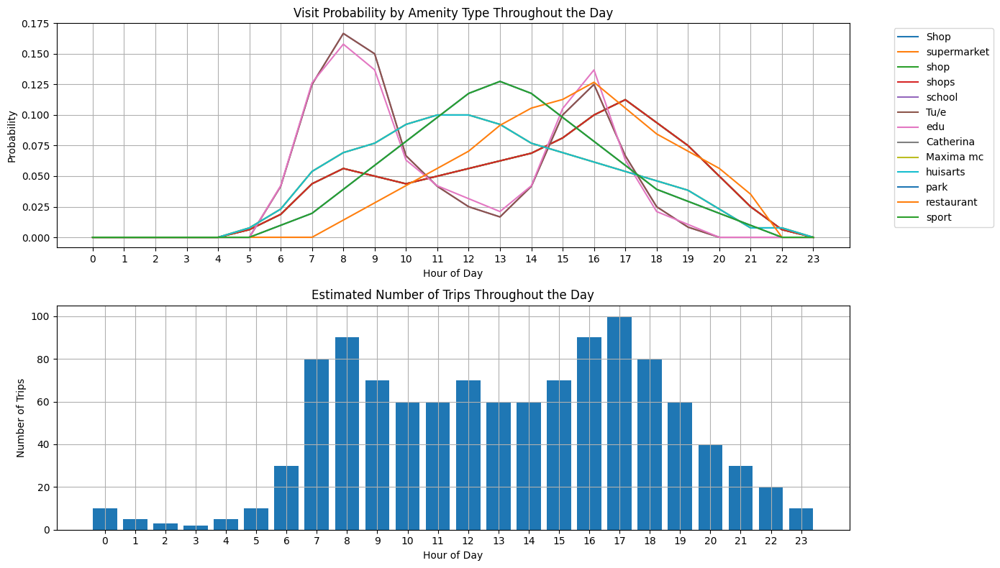

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

weight_vectors = {
    'Shop': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'supermarket': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'shop': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'shops': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 0.8, 0.7, 0.8, 0.9, 1.0, 1.1, 1.3, 1.6, 1.8, 1.5, 1.2, 0.8, 0.4, 0.1, 0],
    'school': [0, 0, 0, 0, 0, 0, 0.5, 1.5, 2.0, 1.8, 0.8, 0.5, 0.3, 0.2, 0.5, 1.2, 1.5, 0.8, 0.3, 0.1, 0, 0, 0, 0],
    'Tu/e': [0, 0, 0, 0, 0, 0, 0.5, 1.5, 2.0, 1.8, 0.8, 0.5, 0.3, 0.2, 0.5, 1.2, 1.5, 0.8, 0.3, 0.1, 0, 0, 0, 0],
    'edu': [0, 0, 0, 0, 0, 0, 0.4, 1.2, 1.5, 1.3, 0.6, 0.4, 0.3, 0.2, 0.4, 1.0, 1.3, 0.6, 0.2, 0.1, 0, 0, 0, 0],
    'Catherina': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 1.0, 1.2, 1.3, 1.3, 1.2, 1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.3, 0.1, 0.1, 0],
    'Maxima mc': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 1.0, 1.2, 1.3, 1.3, 1.2, 1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.3, 0.1, 0.1, 0],
    'huisarts': [0, 0, 0, 0, 0, 0.1, 0.3, 0.7, 0.9, 1.0, 1.2, 1.3, 1.3, 1.2, 1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.3, 0.1, 0.1, 0],
    'park': [0, 0, 0, 0, 0, 0, 0.1, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.3, 1.2, 1.0, 0.8, 0.6, 0.4, 0.3, 0.2, 0.1, 0, 0],
    'restaurant': [0, 0, 0, 0, 0, 0, 0, 0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.3, 1.5, 1.6, 1.8, 1.5, 1.2, 1.0, 0.8, 0.5, 0, 0],
    'sport': [0, 0, 0, 0, 0, 0, 0.1, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.3, 1.2, 1.0, 0.8, 0.6, 0.4, 0.3, 0.2, 0.1, 0, 0]
}

# Create Amenity Probability Table (add prob to user being home)
amenity_types = list(weight_vectors.keys()) + ['home']

# Create a DataFrame with 24 hours as columns
hourly_probs = pd.DataFrame(index=amenity_types, columns=[f'hour_{h}' for h in range(24)])

# Fill with the weight vectors
for amenity, weights in weight_vectors.items():
    total = sum(weights)
    if total > 0:
        hourly_probs.loc[amenity] = [w/total for w in weights]
    else:
        hourly_probs.loc[amenity] = 0

# Add constant probability for 'home' (assume people go home evenly)
home_prob = 0.05  # Constant probability of going home
hourly_probs.loc['home'] = [home_prob] * 24

# Normalize rows to sum to 1
hourly_probs = hourly_probs.div(hourly_probs.sum(axis=1), axis=0)

print("Hourly Visit Probabilities by Amenity Type:")
display(hourly_probs)

# Create General Trip Prediction Table via mobility patterns
# Source-  Netherlands Mobility Report 2022 (CBS/Statistics Netherlands)
# Approximate distribution of trips throughout the day
trip_distribution = {
    'hour_0': 0.01, 'hour_1': 0.005, 'hour_2': 0.003, 'hour_3': 0.002,
    'hour_4': 0.005, 'hour_5': 0.01, 'hour_6': 0.03, 'hour_7': 0.08,
    'hour_8': 0.09, 'hour_9': 0.07, 'hour_10': 0.06, 'hour_11': 0.06,
    'hour_12': 0.07, 'hour_13': 0.06, 'hour_14': 0.06, 'hour_15': 0.07,
    'hour_16': 0.09, 'hour_17': 0.10, 'hour_18': 0.08, 'hour_19': 0.06,
    'hour_20': 0.04, 'hour_21': 0.03, 'hour_22': 0.02, 'hour_23': 0.01
}

trip_predictions = pd.DataFrame.from_dict(trip_distribution, orient='index', columns=['trip_probability'])
trip_predictions.index.name = 'hour_of_day'

# Convert to absolute numbers (assuming 1000 trips per day based on the user pool we have)
total_trips = 1000
trip_predictions['estimated_trips'] = (trip_predictions['trip_probability'] * total_trips).round()

print("\nGeneral Trip Predictions (Dutch Mobility Patterns):")
display(trip_predictions)

# Visualization
plt.figure(figsize=(14, 8))

# Plot amenity probabilities
plt.subplot(2, 1, 1)
for amenity in hourly_probs.index:
    if amenity not in ['home']:  # Skip home for cleaner plot
        plt.plot(range(24), hourly_probs.loc[amenity], label=amenity)
plt.title('Visit Probability by Amenity Type Throughout the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Probability')
plt.xticks(range(24))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Plot trip predictions
plt.subplot(2, 1, 2)
plt.bar(range(24), trip_predictions['estimated_trips'])
plt.title('Estimated Number of Trips Throughout the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(range(24))
plt.grid(True)

plt.tight_layout()
plt.show()

# Save to Excel
with pd.ExcelWriter('mobility_analysis.xlsx') as writer:
    hourly_probs.to_excel(writer, sheet_name='Amenity Probabilities')
    trip_predictions.to_excel(writer, sheet_name='Trip Predictions')

To determine the optimal placement for the stations in our start-up, we first need to analyse the user behaviour in our pool, based on rush hour dynamics, common routes based on ammenities and businesses and hotspots (frequently visited).

For that we summarize the relevant data and generate plots to display it.

First, we load the datasets for the bike lanes, movement (traffic) data, and points of intetest, while contraining the data to our desired  neighbourhoods.

*Sources*: https://overpass-turbo.eu/


Since there isnt any readily available dataset of the cycling flows in Eindhoven (at least i couldnt find any that didnt require a contract), we use the dataset of bicycle sheds/parkings in Eindhoven, and their opening/closing times to estimate traffic flow https://data.eindhoven.nl/explore/dataset/fietsenstallingen/export/?disjunctive.naam_fietsenstalling&disjunctive.type_stalling&disjunctive.openingstijden_maandag&disjunctive.openingstijden_dinsdag&disjunctive.openingstijden_woensdag&disjunctive.openingstijds_donderdag&disjunctive.openingstijden_vrijdag&disjunctive.openingstijden_zaterdag&disjunctive.openingstijden_zondag: